# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [ ]:
# data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

In [3]:
import helper

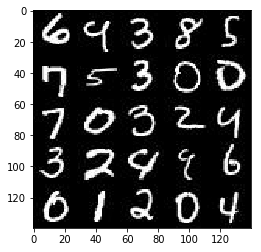

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join('/', 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

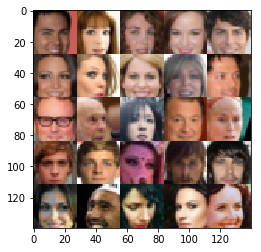

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join('/', 'celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_image = tf.placeholder(tf.float32,shape=[None, image_width, image_height, image_channels])
    z_input = tf.placeholder(tf.float32,shape=[None,z_dim])
    learning_rate = tf.placeholder(tf.float32)
    
    return input_image, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # 28 x 28 x chenel
    
    alpha = 0.2
    
    with tf.variable_scope('discriminator', reuse = reuse) :
        conv1 = tf.layers.conv2d(images,filters=64,kernel_size=5,strides=2,padding='same')
        bn1 = tf.layers.batch_normalization(conv1,training=True)
        relu1 = tf.maximum(bn1,alpha*bn1)
        
        # Now 14 x 14 x  64 
        
        conv2 = tf.layers.conv2d(relu1,filters = 128 , kernel_size=5 , strides= 2, padding='same')
        bn2 = tf.layers.batch_normalization(conv2,training=True)
        relu2 = tf.maximum(bn2,alpha*bn2)
        
        # Now 7 x 7 x 128 
        
        conv3 = tf.layers.conv2d(relu2,filters = 256 , kernel_size=5,strides=2 , padding='same')
        bn3 = tf.layers.batch_normalization(conv3,training=True)
        relu3 = tf.maximum(bn3,alpha*bn3)
        
        # Now  4 x 4 x 256
        ## out_height = ceil(float(in_height) / float(strides[1])) _ ceiling !!
        
        flat = tf.reshape(relu3,[-1,4*4*256])
        
        #Now Batch x (4*4*256)
        logits = tf.layers.dense(flat , 1)
        out = tf.sigmoid(logits)                
    
    # TODO: Implement Function

    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    alpha = 0.2
    filter_depth = 512
    
    # TODO: Implement Function
    with tf.variable_scope('generator',reuse=not is_train):
        
        z_in = tf.layers.dense(z,3*3*filter_depth)
        ## Matrix Operation ( Each row)
        
        z_in = tf.reshape(z_in,[-1,3,3,filter_depth])
        conv_t1 = tf.layers.conv2d_transpose(z_in,filters=filter_depth//2,kernel_size=5,strides=1,padding='valid')
        bn1 = tf.layers.batch_normalization(conv_t1,training=is_train)
        relu1 = tf.maximum(bn1,bn1*alpha)
        
        # Now [ Batch x 7 x 7 x 256 ]
        
        conv_t2 = tf.layers.conv2d_transpose(relu1,filters=filter_depth//4 , kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(conv_t2 , training= is_train)
        relu2 = tf.maximum(bn2,bn2*alpha)
        
        # Now [ Batch x 14 x 14 x 128 ]
        
        conv_t3 = tf.layers.conv2d_transpose(relu2, filters= filter_depth//8 , kernel_size=5 , strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(conv_t3,training=is_train)
        relu3 = tf.maximum(bn3,bn3*alpha)
                    
        #Now [Batch x 28 x 28 x 64]
        
        out_1 = tf.layers.conv2d_transpose(relu3,filters=out_channel_dim,kernel_size=5,strides=1,padding='same')
        out = tf.multiply(tf.tanh(out_1),0.5)
        
        # Normalize the output data to be in range(-0.5,0.5)
        #Now [Batch x 28 x 28 x out_dim]
        
    
    return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_out = generator(input_z,out_channel_dim,is_train=True)
    d_real_out, d_real_logits = discriminator(input_real,reuse=False)
    d_fake_out,d_fake_logits = discriminator(g_out,reuse=True)        
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.zeros_like(d_fake_logits),logits=d_fake_logits))
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(d_real_logits),logits=d_real_logits))
    
    d_loss = d_loss_fake + d_loss_real
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(d_fake_logits),logits=d_fake_logits))
    
    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    # TODO: Implement Function
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [13]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    input_image, z_input , lr = model_inputs(data_shape[1],data_shape[2],data_shape[3],z_dim)
    d_loss, g_loss = model_loss(input_image,z_input,out_channel_dim=data_shape[3])
    d_train_loss , g_train_loss = model_opt(d_loss,g_loss,lr,beta1)
    
    step = 0
    show_img_step = 100
    show_loss = 10
    n_images = 25
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                step = step + 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size,z_dim))
                _ = sess.run(d_train_loss,feed_dict = {input_image : batch_images,z_input:batch_z,lr:learning_rate})
                _ = sess.run(g_train_loss,feed_dict = {input_image : batch_images,z_input:batch_z,lr:learning_rate})
                
                if step % show_loss == 0:
                    
                    d = sess.run(d_loss,feed_dict={input_image : batch_images,z_input:batch_z,lr:learning_rate})
                    g = sess.run(g_loss,feed_dict={input_image : batch_images,z_input:batch_z,lr:learning_rate})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(d),
                          "Generator Loss: {:.4f}".format(g))
                if step % show_img_step == 0:
                    show_generator_output(sess, n_images, z_input, data_shape[3], data_image_mode)
                    
                                            

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 9.7514... Generator Loss: 0.0002
Epoch 1/2... Discriminator Loss: 2.1689... Generator Loss: 0.5182
Epoch 1/2... Discriminator Loss: 2.2555... Generator Loss: 1.9984
Epoch 1/2... Discriminator Loss: 1.7400... Generator Loss: 0.8126
Epoch 1/2... Discriminator Loss: 1.4671... Generator Loss: 0.7341
Epoch 1/2... Discriminator Loss: 1.4349... Generator Loss: 0.7141
Epoch 1/2... Discriminator Loss: 2.3027... Generator Loss: 0.1359
Epoch 1/2... Discriminator Loss: 1.2780... Generator Loss: 1.0837
Epoch 1/2... Discriminator Loss: 1.3691... Generator Loss: 1.3508
Epoch 1/2... Discriminator Loss: 1.4594... Generator Loss: 0.8878


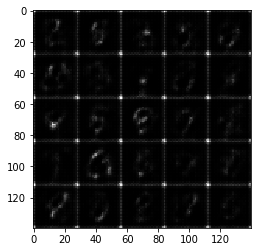

Epoch 1/2... Discriminator Loss: 1.3587... Generator Loss: 0.8628
Epoch 1/2... Discriminator Loss: 0.9793... Generator Loss: 1.3648
Epoch 1/2... Discriminator Loss: 1.3975... Generator Loss: 1.3633
Epoch 1/2... Discriminator Loss: 1.2166... Generator Loss: 1.1623
Epoch 1/2... Discriminator Loss: 1.1795... Generator Loss: 1.3479
Epoch 1/2... Discriminator Loss: 1.5508... Generator Loss: 2.1979
Epoch 1/2... Discriminator Loss: 1.4615... Generator Loss: 0.3447
Epoch 1/2... Discriminator Loss: 2.1217... Generator Loss: 0.1541
Epoch 1/2... Discriminator Loss: 1.2074... Generator Loss: 2.3433
Epoch 1/2... Discriminator Loss: 1.3143... Generator Loss: 1.4915


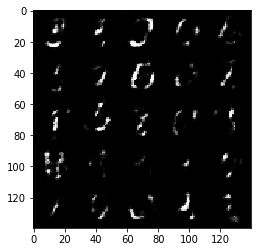

Epoch 1/2... Discriminator Loss: 1.3410... Generator Loss: 0.7384
Epoch 1/2... Discriminator Loss: 1.7657... Generator Loss: 1.4050
Epoch 1/2... Discriminator Loss: 1.4371... Generator Loss: 0.4144
Epoch 1/2... Discriminator Loss: 1.4428... Generator Loss: 0.3938
Epoch 1/2... Discriminator Loss: 1.7292... Generator Loss: 0.2589
Epoch 1/2... Discriminator Loss: 1.4637... Generator Loss: 0.3959
Epoch 1/2... Discriminator Loss: 1.3464... Generator Loss: 0.4710
Epoch 1/2... Discriminator Loss: 1.1887... Generator Loss: 0.6205
Epoch 1/2... Discriminator Loss: 2.2767... Generator Loss: 2.1709
Epoch 1/2... Discriminator Loss: 1.3082... Generator Loss: 0.9729


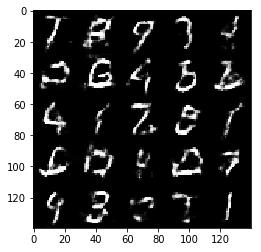

Epoch 1/2... Discriminator Loss: 1.6701... Generator Loss: 0.2776
Epoch 1/2... Discriminator Loss: 1.1527... Generator Loss: 0.8365
Epoch 1/2... Discriminator Loss: 1.5879... Generator Loss: 1.4006
Epoch 1/2... Discriminator Loss: 1.3032... Generator Loss: 0.5157
Epoch 1/2... Discriminator Loss: 1.2972... Generator Loss: 1.0907
Epoch 1/2... Discriminator Loss: 1.2597... Generator Loss: 0.6391
Epoch 1/2... Discriminator Loss: 1.3030... Generator Loss: 0.8668
Epoch 1/2... Discriminator Loss: 1.1967... Generator Loss: 0.5064
Epoch 1/2... Discriminator Loss: 1.7727... Generator Loss: 0.2308
Epoch 1/2... Discriminator Loss: 1.1820... Generator Loss: 0.5975


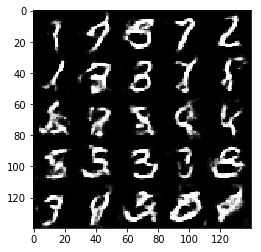

Epoch 1/2... Discriminator Loss: 1.3500... Generator Loss: 0.9702
Epoch 1/2... Discriminator Loss: 1.2501... Generator Loss: 1.6329
Epoch 1/2... Discriminator Loss: 1.1373... Generator Loss: 0.8983
Epoch 1/2... Discriminator Loss: 1.2573... Generator Loss: 0.6984
Epoch 1/2... Discriminator Loss: 1.1265... Generator Loss: 0.8376
Epoch 1/2... Discriminator Loss: 1.4086... Generator Loss: 0.3759
Epoch 1/2... Discriminator Loss: 1.0791... Generator Loss: 1.0422
Epoch 1/2... Discriminator Loss: 1.1657... Generator Loss: 0.9561
Epoch 1/2... Discriminator Loss: 1.0486... Generator Loss: 1.0883
Epoch 1/2... Discriminator Loss: 1.3138... Generator Loss: 0.5262


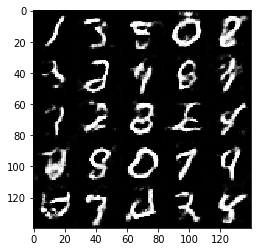

Epoch 1/2... Discriminator Loss: 1.3434... Generator Loss: 0.4414
Epoch 1/2... Discriminator Loss: 1.6037... Generator Loss: 0.2856
Epoch 1/2... Discriminator Loss: 1.2965... Generator Loss: 0.4610
Epoch 1/2... Discriminator Loss: 1.7372... Generator Loss: 0.2317
Epoch 1/2... Discriminator Loss: 1.1924... Generator Loss: 0.5366
Epoch 1/2... Discriminator Loss: 1.0702... Generator Loss: 0.6386
Epoch 1/2... Discriminator Loss: 1.2705... Generator Loss: 0.4863
Epoch 1/2... Discriminator Loss: 1.0804... Generator Loss: 1.1531
Epoch 1/2... Discriminator Loss: 1.1443... Generator Loss: 0.8197
Epoch 1/2... Discriminator Loss: 1.1450... Generator Loss: 0.6702


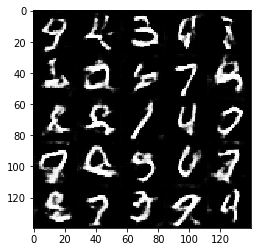

Epoch 1/2... Discriminator Loss: 1.3837... Generator Loss: 0.4064
Epoch 1/2... Discriminator Loss: 1.0607... Generator Loss: 1.1650
Epoch 1/2... Discriminator Loss: 1.1712... Generator Loss: 1.4743
Epoch 1/2... Discriminator Loss: 1.4633... Generator Loss: 1.3415
Epoch 1/2... Discriminator Loss: 1.0270... Generator Loss: 0.8456
Epoch 1/2... Discriminator Loss: 1.0511... Generator Loss: 0.9232
Epoch 1/2... Discriminator Loss: 1.5251... Generator Loss: 1.5572
Epoch 1/2... Discriminator Loss: 1.3880... Generator Loss: 0.4321
Epoch 1/2... Discriminator Loss: 1.2048... Generator Loss: 0.5322
Epoch 1/2... Discriminator Loss: 1.1407... Generator Loss: 0.6403


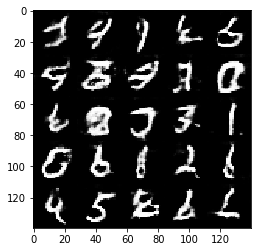

Epoch 1/2... Discriminator Loss: 0.9571... Generator Loss: 0.9000
Epoch 1/2... Discriminator Loss: 2.2498... Generator Loss: 0.1366
Epoch 1/2... Discriminator Loss: 1.1901... Generator Loss: 0.4908
Epoch 1/2... Discriminator Loss: 1.3547... Generator Loss: 0.3885
Epoch 1/2... Discriminator Loss: 1.2101... Generator Loss: 1.2119
Epoch 1/2... Discriminator Loss: 0.8625... Generator Loss: 0.9130
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 0.5201
Epoch 1/2... Discriminator Loss: 0.8887... Generator Loss: 1.0114
Epoch 1/2... Discriminator Loss: 0.8096... Generator Loss: 0.8980
Epoch 1/2... Discriminator Loss: 1.1121... Generator Loss: 1.5430


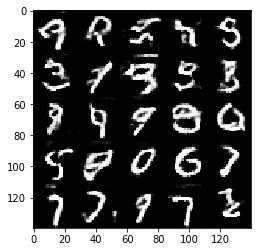

Epoch 1/2... Discriminator Loss: 0.8074... Generator Loss: 1.1010
Epoch 1/2... Discriminator Loss: 0.9849... Generator Loss: 1.1320
Epoch 1/2... Discriminator Loss: 1.1970... Generator Loss: 0.5156
Epoch 1/2... Discriminator Loss: 1.4442... Generator Loss: 0.3563
Epoch 1/2... Discriminator Loss: 1.2901... Generator Loss: 0.4412
Epoch 1/2... Discriminator Loss: 1.2505... Generator Loss: 0.5185
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 1.1046
Epoch 1/2... Discriminator Loss: 0.8826... Generator Loss: 1.5293
Epoch 1/2... Discriminator Loss: 1.4350... Generator Loss: 0.3279
Epoch 1/2... Discriminator Loss: 1.0147... Generator Loss: 0.7398


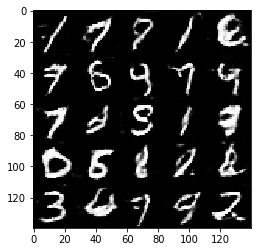

Epoch 1/2... Discriminator Loss: 1.2372... Generator Loss: 0.4687
Epoch 1/2... Discriminator Loss: 0.8448... Generator Loss: 1.2939
Epoch 1/2... Discriminator Loss: 0.8462... Generator Loss: 1.3617
Epoch 1/2... Discriminator Loss: 1.1288... Generator Loss: 1.8738
Epoch 1/2... Discriminator Loss: 0.8829... Generator Loss: 1.3452
Epoch 1/2... Discriminator Loss: 0.9330... Generator Loss: 0.6614
Epoch 1/2... Discriminator Loss: 2.2071... Generator Loss: 0.1372
Epoch 1/2... Discriminator Loss: 1.1071... Generator Loss: 0.7103
Epoch 1/2... Discriminator Loss: 1.4312... Generator Loss: 0.3757
Epoch 1/2... Discriminator Loss: 1.0544... Generator Loss: 0.5749


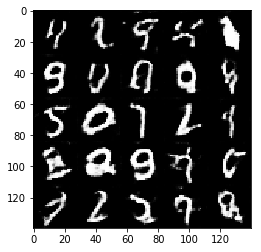

Epoch 1/2... Discriminator Loss: 1.5355... Generator Loss: 2.0984
Epoch 1/2... Discriminator Loss: 1.0109... Generator Loss: 0.6282
Epoch 1/2... Discriminator Loss: 0.8936... Generator Loss: 1.1966
Epoch 1/2... Discriminator Loss: 1.0343... Generator Loss: 0.5734
Epoch 1/2... Discriminator Loss: 1.1719... Generator Loss: 0.5995
Epoch 1/2... Discriminator Loss: 0.8876... Generator Loss: 0.8952
Epoch 1/2... Discriminator Loss: 1.6528... Generator Loss: 2.4633
Epoch 1/2... Discriminator Loss: 0.9632... Generator Loss: 0.7124
Epoch 1/2... Discriminator Loss: 1.0747... Generator Loss: 2.0538
Epoch 1/2... Discriminator Loss: 0.8362... Generator Loss: 1.0681


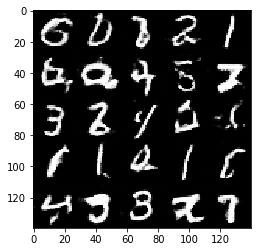

Epoch 1/2... Discriminator Loss: 1.4455... Generator Loss: 0.3697
Epoch 1/2... Discriminator Loss: 0.6143... Generator Loss: 1.3107
Epoch 1/2... Discriminator Loss: 0.8141... Generator Loss: 0.7825
Epoch 1/2... Discriminator Loss: 1.3488... Generator Loss: 0.4601
Epoch 1/2... Discriminator Loss: 0.5999... Generator Loss: 1.5955
Epoch 1/2... Discriminator Loss: 1.7180... Generator Loss: 0.2900
Epoch 1/2... Discriminator Loss: 1.0492... Generator Loss: 0.8420
Epoch 1/2... Discriminator Loss: 0.9465... Generator Loss: 0.8882
Epoch 1/2... Discriminator Loss: 1.4161... Generator Loss: 0.3888
Epoch 1/2... Discriminator Loss: 1.6060... Generator Loss: 0.2832


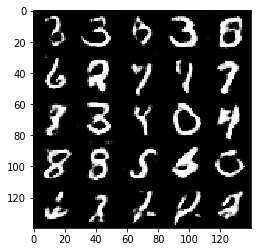

Epoch 1/2... Discriminator Loss: 0.7799... Generator Loss: 1.0666
Epoch 1/2... Discriminator Loss: 1.3345... Generator Loss: 0.4747
Epoch 1/2... Discriminator Loss: 0.9490... Generator Loss: 0.8063
Epoch 1/2... Discriminator Loss: 0.8674... Generator Loss: 0.9385
Epoch 1/2... Discriminator Loss: 1.9632... Generator Loss: 0.2092
Epoch 1/2... Discriminator Loss: 1.1523... Generator Loss: 0.5385
Epoch 1/2... Discriminator Loss: 0.9898... Generator Loss: 0.6790
Epoch 1/2... Discriminator Loss: 0.7437... Generator Loss: 1.3951
Epoch 1/2... Discriminator Loss: 1.2317... Generator Loss: 0.5039
Epoch 1/2... Discriminator Loss: 0.9158... Generator Loss: 0.7004


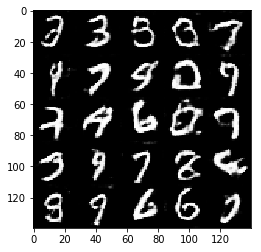

Epoch 1/2... Discriminator Loss: 1.0162... Generator Loss: 0.6454
Epoch 1/2... Discriminator Loss: 0.7886... Generator Loss: 1.0994
Epoch 1/2... Discriminator Loss: 0.7946... Generator Loss: 1.0438
Epoch 1/2... Discriminator Loss: 0.8558... Generator Loss: 1.9817
Epoch 1/2... Discriminator Loss: 1.2686... Generator Loss: 1.6800
Epoch 1/2... Discriminator Loss: 1.1649... Generator Loss: 0.4963
Epoch 1/2... Discriminator Loss: 1.1963... Generator Loss: 2.3772
Epoch 1/2... Discriminator Loss: 0.6758... Generator Loss: 1.3043
Epoch 1/2... Discriminator Loss: 0.9867... Generator Loss: 0.7223
Epoch 1/2... Discriminator Loss: 0.7992... Generator Loss: 1.5577


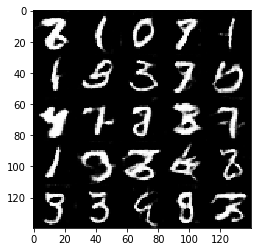

Epoch 1/2... Discriminator Loss: 0.6991... Generator Loss: 0.9837
Epoch 1/2... Discriminator Loss: 0.7840... Generator Loss: 1.9986
Epoch 1/2... Discriminator Loss: 1.5315... Generator Loss: 0.3036
Epoch 1/2... Discriminator Loss: 0.7195... Generator Loss: 2.0696
Epoch 1/2... Discriminator Loss: 0.7679... Generator Loss: 1.8118
Epoch 1/2... Discriminator Loss: 0.6247... Generator Loss: 1.6468
Epoch 1/2... Discriminator Loss: 1.2343... Generator Loss: 2.2999
Epoch 1/2... Discriminator Loss: 0.7392... Generator Loss: 1.0818
Epoch 1/2... Discriminator Loss: 3.0254... Generator Loss: 4.4501
Epoch 1/2... Discriminator Loss: 1.0150... Generator Loss: 1.3143


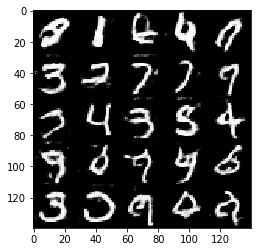

Epoch 1/2... Discriminator Loss: 0.8285... Generator Loss: 0.7332
Epoch 1/2... Discriminator Loss: 0.7671... Generator Loss: 1.0010
Epoch 1/2... Discriminator Loss: 1.5737... Generator Loss: 0.3454
Epoch 1/2... Discriminator Loss: 1.1061... Generator Loss: 1.2947
Epoch 1/2... Discriminator Loss: 1.3535... Generator Loss: 0.3927
Epoch 1/2... Discriminator Loss: 1.0345... Generator Loss: 0.6037
Epoch 1/2... Discriminator Loss: 0.7818... Generator Loss: 0.8256
Epoch 1/2... Discriminator Loss: 1.8499... Generator Loss: 0.2759
Epoch 1/2... Discriminator Loss: 1.0807... Generator Loss: 0.5918
Epoch 1/2... Discriminator Loss: 0.5756... Generator Loss: 1.0834


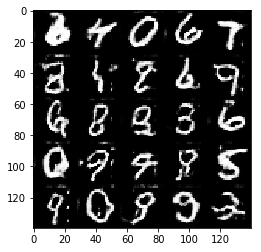

Epoch 1/2... Discriminator Loss: 1.4141... Generator Loss: 2.4954
Epoch 1/2... Discriminator Loss: 1.0441... Generator Loss: 0.6684
Epoch 1/2... Discriminator Loss: 0.7998... Generator Loss: 0.8011
Epoch 1/2... Discriminator Loss: 0.6710... Generator Loss: 1.8332
Epoch 1/2... Discriminator Loss: 0.6347... Generator Loss: 1.5081
Epoch 1/2... Discriminator Loss: 0.6769... Generator Loss: 1.3255
Epoch 1/2... Discriminator Loss: 0.9239... Generator Loss: 0.8837
Epoch 1/2... Discriminator Loss: 1.7162... Generator Loss: 0.2426
Epoch 1/2... Discriminator Loss: 0.5278... Generator Loss: 1.5156
Epoch 1/2... Discriminator Loss: 1.1814... Generator Loss: 2.6327


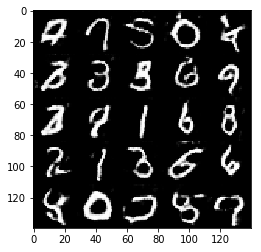

Epoch 1/2... Discriminator Loss: 0.5860... Generator Loss: 2.2079
Epoch 1/2... Discriminator Loss: 0.4629... Generator Loss: 1.4297
Epoch 1/2... Discriminator Loss: 0.3901... Generator Loss: 1.4636
Epoch 1/2... Discriminator Loss: 0.6602... Generator Loss: 2.4964
Epoch 1/2... Discriminator Loss: 1.0475... Generator Loss: 0.5586
Epoch 1/2... Discriminator Loss: 0.4186... Generator Loss: 1.8590
Epoch 1/2... Discriminator Loss: 1.7845... Generator Loss: 2.5397
Epoch 1/2... Discriminator Loss: 0.7681... Generator Loss: 1.3623
Epoch 1/2... Discriminator Loss: 0.7781... Generator Loss: 0.8274
Epoch 1/2... Discriminator Loss: 0.7475... Generator Loss: 0.8897


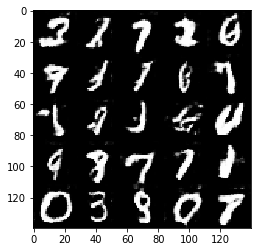

Epoch 1/2... Discriminator Loss: 1.8630... Generator Loss: 0.2150
Epoch 1/2... Discriminator Loss: 1.1586... Generator Loss: 0.4542
Epoch 1/2... Discriminator Loss: 0.9894... Generator Loss: 0.6413
Epoch 1/2... Discriminator Loss: 0.9457... Generator Loss: 0.6561
Epoch 1/2... Discriminator Loss: 2.7021... Generator Loss: 0.0865
Epoch 1/2... Discriminator Loss: 0.5973... Generator Loss: 1.1977
Epoch 1/2... Discriminator Loss: 1.9601... Generator Loss: 0.1854
Epoch 2/2... Discriminator Loss: 0.6398... Generator Loss: 1.1839
Epoch 2/2... Discriminator Loss: 1.5605... Generator Loss: 0.3103
Epoch 2/2... Discriminator Loss: 0.6370... Generator Loss: 1.0880


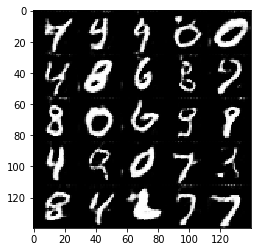

Epoch 2/2... Discriminator Loss: 0.8987... Generator Loss: 0.6658
Epoch 2/2... Discriminator Loss: 2.4195... Generator Loss: 0.1619
Epoch 2/2... Discriminator Loss: 0.6315... Generator Loss: 2.0326
Epoch 2/2... Discriminator Loss: 1.1686... Generator Loss: 0.5314
Epoch 2/2... Discriminator Loss: 1.5690... Generator Loss: 0.2865
Epoch 2/2... Discriminator Loss: 1.0463... Generator Loss: 0.5511
Epoch 2/2... Discriminator Loss: 0.5210... Generator Loss: 1.1360
Epoch 2/2... Discriminator Loss: 1.3479... Generator Loss: 3.7251
Epoch 2/2... Discriminator Loss: 0.5539... Generator Loss: 1.1442
Epoch 2/2... Discriminator Loss: 0.7970... Generator Loss: 2.7174


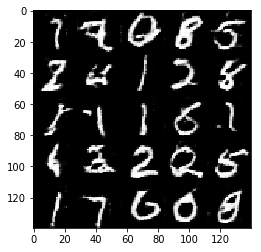

Epoch 2/2... Discriminator Loss: 0.3126... Generator Loss: 2.8270
Epoch 2/2... Discriminator Loss: 0.7839... Generator Loss: 0.9491
Epoch 2/2... Discriminator Loss: 0.8277... Generator Loss: 0.7791
Epoch 2/2... Discriminator Loss: 1.2282... Generator Loss: 0.4652
Epoch 2/2... Discriminator Loss: 0.5477... Generator Loss: 2.5646
Epoch 2/2... Discriminator Loss: 0.3491... Generator Loss: 1.9740
Epoch 2/2... Discriminator Loss: 0.3706... Generator Loss: 2.1019
Epoch 2/2... Discriminator Loss: 1.1872... Generator Loss: 0.6195
Epoch 2/2... Discriminator Loss: 1.5070... Generator Loss: 0.3741
Epoch 2/2... Discriminator Loss: 0.6758... Generator Loss: 2.5977


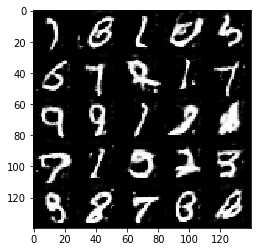

Epoch 2/2... Discriminator Loss: 1.0388... Generator Loss: 1.9815
Epoch 2/2... Discriminator Loss: 0.8060... Generator Loss: 0.8139
Epoch 2/2... Discriminator Loss: 0.7544... Generator Loss: 0.7845
Epoch 2/2... Discriminator Loss: 0.5154... Generator Loss: 3.3293
Epoch 2/2... Discriminator Loss: 1.0637... Generator Loss: 0.5251
Epoch 2/2... Discriminator Loss: 0.5458... Generator Loss: 1.2118
Epoch 2/2... Discriminator Loss: 1.7316... Generator Loss: 0.3746
Epoch 2/2... Discriminator Loss: 0.5474... Generator Loss: 2.5460
Epoch 2/2... Discriminator Loss: 0.3229... Generator Loss: 1.9832
Epoch 2/2... Discriminator Loss: 2.0387... Generator Loss: 0.3417


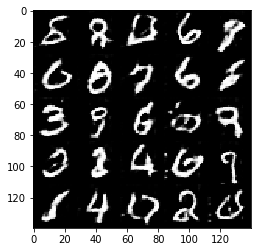

Epoch 2/2... Discriminator Loss: 0.8749... Generator Loss: 2.0398
Epoch 2/2... Discriminator Loss: 1.2848... Generator Loss: 4.1588
Epoch 2/2... Discriminator Loss: 0.5518... Generator Loss: 1.2180
Epoch 2/2... Discriminator Loss: 0.5452... Generator Loss: 1.2563
Epoch 2/2... Discriminator Loss: 1.0673... Generator Loss: 0.5692
Epoch 2/2... Discriminator Loss: 0.9820... Generator Loss: 0.6659
Epoch 2/2... Discriminator Loss: 0.6543... Generator Loss: 1.0876
Epoch 2/2... Discriminator Loss: 0.8935... Generator Loss: 0.6502
Epoch 2/2... Discriminator Loss: 0.5315... Generator Loss: 1.5161
Epoch 2/2... Discriminator Loss: 2.1367... Generator Loss: 0.2246


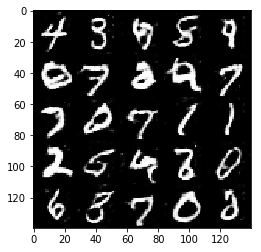

Epoch 2/2... Discriminator Loss: 0.4926... Generator Loss: 1.2680
Epoch 2/2... Discriminator Loss: 1.1895... Generator Loss: 0.5525
Epoch 2/2... Discriminator Loss: 0.5231... Generator Loss: 1.1944
Epoch 2/2... Discriminator Loss: 0.5157... Generator Loss: 1.5426
Epoch 2/2... Discriminator Loss: 0.5580... Generator Loss: 1.1450
Epoch 2/2... Discriminator Loss: 0.9853... Generator Loss: 0.6514
Epoch 2/2... Discriminator Loss: 0.7662... Generator Loss: 0.9365
Epoch 2/2... Discriminator Loss: 0.9090... Generator Loss: 0.6817
Epoch 2/2... Discriminator Loss: 1.0955... Generator Loss: 0.5122
Epoch 2/2... Discriminator Loss: 0.4095... Generator Loss: 1.8570


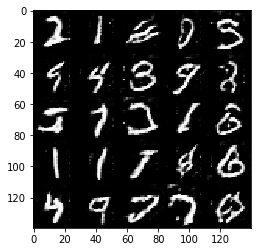

Epoch 2/2... Discriminator Loss: 1.2038... Generator Loss: 0.4831
Epoch 2/2... Discriminator Loss: 2.0079... Generator Loss: 0.2464
Epoch 2/2... Discriminator Loss: 1.4015... Generator Loss: 0.4518
Epoch 2/2... Discriminator Loss: 0.5045... Generator Loss: 1.3564
Epoch 2/2... Discriminator Loss: 0.8663... Generator Loss: 0.7587
Epoch 2/2... Discriminator Loss: 0.7463... Generator Loss: 0.9805
Epoch 2/2... Discriminator Loss: 0.3482... Generator Loss: 1.9185
Epoch 2/2... Discriminator Loss: 1.6722... Generator Loss: 3.9699
Epoch 2/2... Discriminator Loss: 0.8657... Generator Loss: 0.7950
Epoch 2/2... Discriminator Loss: 0.6358... Generator Loss: 1.1592


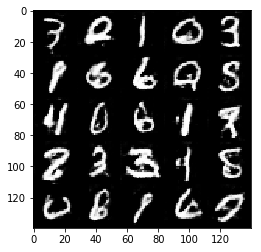

Epoch 2/2... Discriminator Loss: 1.0847... Generator Loss: 0.6936
Epoch 2/2... Discriminator Loss: 0.6658... Generator Loss: 0.9719
Epoch 2/2... Discriminator Loss: 0.8922... Generator Loss: 0.6821
Epoch 2/2... Discriminator Loss: 0.3270... Generator Loss: 1.9366
Epoch 2/2... Discriminator Loss: 0.2330... Generator Loss: 2.8257
Epoch 2/2... Discriminator Loss: 0.8810... Generator Loss: 1.3615
Epoch 2/2... Discriminator Loss: 0.5992... Generator Loss: 2.2961
Epoch 2/2... Discriminator Loss: 0.7595... Generator Loss: 0.8268
Epoch 2/2... Discriminator Loss: 0.5653... Generator Loss: 1.0618
Epoch 2/2... Discriminator Loss: 0.6622... Generator Loss: 1.0162


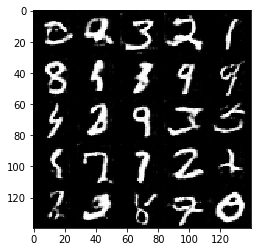

Epoch 2/2... Discriminator Loss: 0.4731... Generator Loss: 1.5198
Epoch 2/2... Discriminator Loss: 1.9409... Generator Loss: 3.3978
Epoch 2/2... Discriminator Loss: 0.4934... Generator Loss: 1.2770
Epoch 2/2... Discriminator Loss: 0.5130... Generator Loss: 1.3652
Epoch 2/2... Discriminator Loss: 0.9699... Generator Loss: 0.7079
Epoch 2/2... Discriminator Loss: 0.3975... Generator Loss: 2.4684
Epoch 2/2... Discriminator Loss: 0.5869... Generator Loss: 2.8691
Epoch 2/2... Discriminator Loss: 0.1910... Generator Loss: 3.8175
Epoch 2/2... Discriminator Loss: 0.9643... Generator Loss: 0.6212
Epoch 2/2... Discriminator Loss: 0.3905... Generator Loss: 1.5293


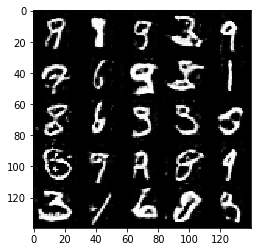

Epoch 2/2... Discriminator Loss: 0.5313... Generator Loss: 2.2905
Epoch 2/2... Discriminator Loss: 0.8177... Generator Loss: 3.4169
Epoch 2/2... Discriminator Loss: 2.4831... Generator Loss: 0.1577
Epoch 2/2... Discriminator Loss: 0.7837... Generator Loss: 2.6756
Epoch 2/2... Discriminator Loss: 0.9267... Generator Loss: 0.7239
Epoch 2/2... Discriminator Loss: 0.6658... Generator Loss: 0.9675
Epoch 2/2... Discriminator Loss: 0.5820... Generator Loss: 1.6034
Epoch 2/2... Discriminator Loss: 0.8752... Generator Loss: 2.9376
Epoch 2/2... Discriminator Loss: 1.0105... Generator Loss: 0.6302
Epoch 2/2... Discriminator Loss: 0.9195... Generator Loss: 0.6422


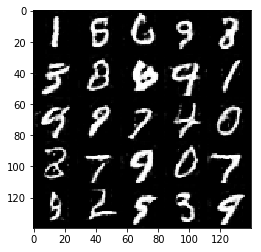

Epoch 2/2... Discriminator Loss: 1.5644... Generator Loss: 0.3578
Epoch 2/2... Discriminator Loss: 0.3363... Generator Loss: 1.6966
Epoch 2/2... Discriminator Loss: 0.8547... Generator Loss: 3.2411
Epoch 2/2... Discriminator Loss: 0.4767... Generator Loss: 1.4161
Epoch 2/2... Discriminator Loss: 0.3190... Generator Loss: 2.5030
Epoch 2/2... Discriminator Loss: 1.2528... Generator Loss: 0.4820
Epoch 2/2... Discriminator Loss: 0.6917... Generator Loss: 0.9826
Epoch 2/2... Discriminator Loss: 0.2003... Generator Loss: 2.1460
Epoch 2/2... Discriminator Loss: 2.1644... Generator Loss: 4.0555
Epoch 2/2... Discriminator Loss: 1.1564... Generator Loss: 2.3613


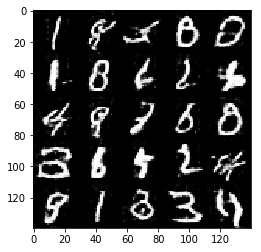

Epoch 2/2... Discriminator Loss: 0.6141... Generator Loss: 1.9122
Epoch 2/2... Discriminator Loss: 0.3905... Generator Loss: 1.6622
Epoch 2/2... Discriminator Loss: 0.3638... Generator Loss: 1.7505
Epoch 2/2... Discriminator Loss: 1.1301... Generator Loss: 3.2260
Epoch 2/2... Discriminator Loss: 0.5314... Generator Loss: 1.2203
Epoch 2/2... Discriminator Loss: 0.6418... Generator Loss: 1.8431
Epoch 2/2... Discriminator Loss: 0.3745... Generator Loss: 2.6799
Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 2.6857
Epoch 2/2... Discriminator Loss: 0.4336... Generator Loss: 1.8143
Epoch 2/2... Discriminator Loss: 0.2850... Generator Loss: 1.9127


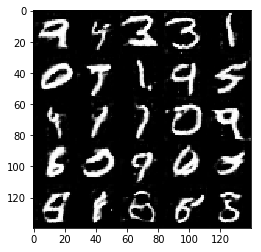

Epoch 2/2... Discriminator Loss: 0.5603... Generator Loss: 1.1959
Epoch 2/2... Discriminator Loss: 1.0415... Generator Loss: 0.6804
Epoch 2/2... Discriminator Loss: 0.4797... Generator Loss: 2.4423
Epoch 2/2... Discriminator Loss: 1.2339... Generator Loss: 3.2153
Epoch 2/2... Discriminator Loss: 1.0081... Generator Loss: 0.6124
Epoch 2/2... Discriminator Loss: 0.9585... Generator Loss: 0.7331
Epoch 2/2... Discriminator Loss: 0.3741... Generator Loss: 1.5093
Epoch 2/2... Discriminator Loss: 0.5881... Generator Loss: 1.1229
Epoch 2/2... Discriminator Loss: 2.2191... Generator Loss: 4.5645
Epoch 2/2... Discriminator Loss: 0.5606... Generator Loss: 1.6619


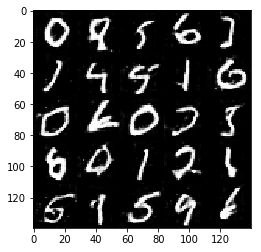

Epoch 2/2... Discriminator Loss: 1.2424... Generator Loss: 0.5481
Epoch 2/2... Discriminator Loss: 0.8789... Generator Loss: 0.9453
Epoch 2/2... Discriminator Loss: 0.8325... Generator Loss: 0.8757
Epoch 2/2... Discriminator Loss: 0.6099... Generator Loss: 1.2934
Epoch 2/2... Discriminator Loss: 0.6902... Generator Loss: 1.0228
Epoch 2/2... Discriminator Loss: 0.2902... Generator Loss: 1.7985
Epoch 2/2... Discriminator Loss: 0.4027... Generator Loss: 2.9786
Epoch 2/2... Discriminator Loss: 0.4514... Generator Loss: 1.3427
Epoch 2/2... Discriminator Loss: 0.6906... Generator Loss: 0.9821
Epoch 2/2... Discriminator Loss: 0.3848... Generator Loss: 1.4460


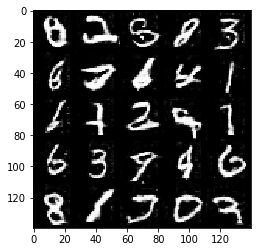

Epoch 2/2... Discriminator Loss: 0.1934... Generator Loss: 2.3537
Epoch 2/2... Discriminator Loss: 0.7620... Generator Loss: 0.9796
Epoch 2/2... Discriminator Loss: 0.6419... Generator Loss: 1.2913
Epoch 2/2... Discriminator Loss: 0.4899... Generator Loss: 2.8799
Epoch 2/2... Discriminator Loss: 0.4366... Generator Loss: 1.3897
Epoch 2/2... Discriminator Loss: 0.9123... Generator Loss: 3.8805
Epoch 2/2... Discriminator Loss: 0.4764... Generator Loss: 2.5930
Epoch 2/2... Discriminator Loss: 1.5259... Generator Loss: 0.3999
Epoch 2/2... Discriminator Loss: 0.6169... Generator Loss: 1.0697
Epoch 2/2... Discriminator Loss: 0.5336... Generator Loss: 1.7768


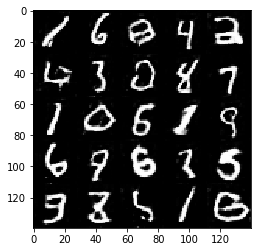

Epoch 2/2... Discriminator Loss: 0.5273... Generator Loss: 1.8358
Epoch 2/2... Discriminator Loss: 1.0948... Generator Loss: 0.5849
Epoch 2/2... Discriminator Loss: 1.7501... Generator Loss: 0.3281
Epoch 2/2... Discriminator Loss: 1.1986... Generator Loss: 0.4837
Epoch 2/2... Discriminator Loss: 0.4525... Generator Loss: 2.7850
Epoch 2/2... Discriminator Loss: 0.4329... Generator Loss: 1.4638
Epoch 2/2... Discriminator Loss: 0.9672... Generator Loss: 0.7702
Epoch 2/2... Discriminator Loss: 0.4141... Generator Loss: 2.3177
Epoch 2/2... Discriminator Loss: 1.4079... Generator Loss: 0.4579
Epoch 2/2... Discriminator Loss: 0.7570... Generator Loss: 2.9707


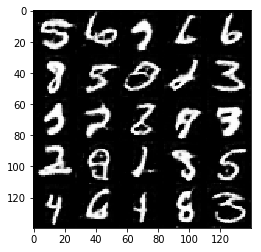

Epoch 2/2... Discriminator Loss: 0.6874... Generator Loss: 0.9450
Epoch 2/2... Discriminator Loss: 0.3565... Generator Loss: 2.6598
Epoch 2/2... Discriminator Loss: 0.2256... Generator Loss: 2.9552
Epoch 2/2... Discriminator Loss: 0.7200... Generator Loss: 2.3016
Epoch 2/2... Discriminator Loss: 0.5128... Generator Loss: 1.2503
Epoch 2/2... Discriminator Loss: 0.8749... Generator Loss: 0.6966
Epoch 2/2... Discriminator Loss: 0.1676... Generator Loss: 2.4430
Epoch 2/2... Discriminator Loss: 0.5550... Generator Loss: 1.2159
Epoch 2/2... Discriminator Loss: 0.8874... Generator Loss: 0.7680
Epoch 2/2... Discriminator Loss: 0.9410... Generator Loss: 0.6635


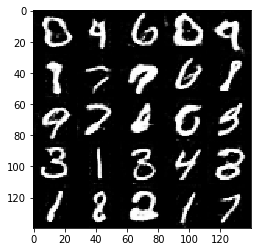

Epoch 2/2... Discriminator Loss: 1.0729... Generator Loss: 0.5739
Epoch 2/2... Discriminator Loss: 0.1994... Generator Loss: 2.3431
Epoch 2/2... Discriminator Loss: 1.4708... Generator Loss: 0.4125
Epoch 2/2... Discriminator Loss: 0.5779... Generator Loss: 1.6249
Epoch 2/2... Discriminator Loss: 1.3606... Generator Loss: 3.8143
Epoch 2/2... Discriminator Loss: 0.5153... Generator Loss: 1.2106
Epoch 2/2... Discriminator Loss: 0.8168... Generator Loss: 0.9939
Epoch 2/2... Discriminator Loss: 0.4378... Generator Loss: 1.3076
Epoch 2/2... Discriminator Loss: 0.5757... Generator Loss: 2.8241
Epoch 2/2... Discriminator Loss: 0.7473... Generator Loss: 0.9968


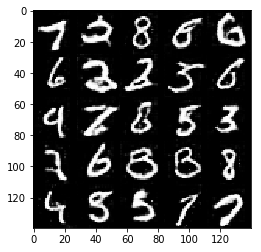

Epoch 2/2... Discriminator Loss: 0.3184... Generator Loss: 1.8307
Epoch 2/2... Discriminator Loss: 0.6243... Generator Loss: 1.3201
Epoch 2/2... Discriminator Loss: 0.7065... Generator Loss: 0.9552
Epoch 2/2... Discriminator Loss: 0.4572... Generator Loss: 1.3609
Epoch 2/2... Discriminator Loss: 1.2308... Generator Loss: 2.8893
Epoch 2/2... Discriminator Loss: 0.5697... Generator Loss: 1.9474
Epoch 2/2... Discriminator Loss: 0.9170... Generator Loss: 0.7613
Epoch 2/2... Discriminator Loss: 0.1715... Generator Loss: 2.5776
Epoch 2/2... Discriminator Loss: 0.3093... Generator Loss: 1.7804
Epoch 2/2... Discriminator Loss: 0.4312... Generator Loss: 1.4732


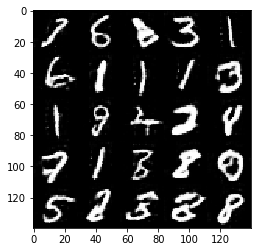

Epoch 2/2... Discriminator Loss: 2.1435... Generator Loss: 0.2048
Epoch 2/2... Discriminator Loss: 1.3628... Generator Loss: 0.4751
Epoch 2/2... Discriminator Loss: 0.5351... Generator Loss: 2.3966
Epoch 2/2... Discriminator Loss: 0.4625... Generator Loss: 1.4166
Epoch 2/2... Discriminator Loss: 0.8378... Generator Loss: 0.7562


In [14]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join('/', 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 5.7769... Generator Loss: 0.0511
Epoch 1/5... Discriminator Loss: 4.8885... Generator Loss: 0.0237
Epoch 1/5... Discriminator Loss: 0.9781... Generator Loss: 2.2250
Epoch 1/5... Discriminator Loss: 2.7056... Generator Loss: 0.1956
Epoch 1/5... Discriminator Loss: 0.5220... Generator Loss: 7.0512
Epoch 1/5... Discriminator Loss: 1.0834... Generator Loss: 2.0303
Epoch 1/5... Discriminator Loss: 0.8166... Generator Loss: 1.6354
Epoch 1/5... Discriminator Loss: 0.7074... Generator Loss: 1.5122
Epoch 1/5... Discriminator Loss: 2.5968... Generator Loss: 0.0968
Epoch 1/5... Discriminator Loss: 1.5594... Generator Loss: 0.3608


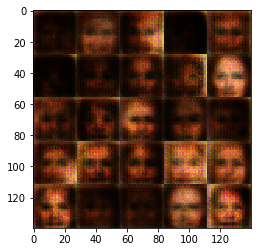

Epoch 1/5... Discriminator Loss: 2.0215... Generator Loss: 0.1867
Epoch 1/5... Discriminator Loss: 0.8021... Generator Loss: 1.5296
Epoch 1/5... Discriminator Loss: 1.1871... Generator Loss: 0.8794
Epoch 1/5... Discriminator Loss: 1.3929... Generator Loss: 0.8837
Epoch 1/5... Discriminator Loss: 1.5748... Generator Loss: 1.9931
Epoch 1/5... Discriminator Loss: 1.2256... Generator Loss: 0.8890
Epoch 1/5... Discriminator Loss: 1.5045... Generator Loss: 0.9894
Epoch 1/5... Discriminator Loss: 1.4268... Generator Loss: 1.3425
Epoch 1/5... Discriminator Loss: 2.0900... Generator Loss: 0.1799
Epoch 1/5... Discriminator Loss: 1.5877... Generator Loss: 0.2897


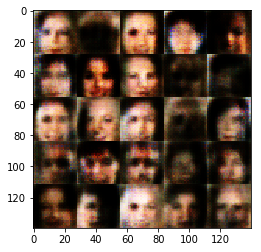

Epoch 1/5... Discriminator Loss: 0.7719... Generator Loss: 1.6094
Epoch 1/5... Discriminator Loss: 1.0167... Generator Loss: 0.8614
Epoch 1/5... Discriminator Loss: 1.3818... Generator Loss: 0.4049
Epoch 1/5... Discriminator Loss: 1.6098... Generator Loss: 1.3622
Epoch 1/5... Discriminator Loss: 1.6230... Generator Loss: 0.2904
Epoch 1/5... Discriminator Loss: 1.8829... Generator Loss: 0.2735
Epoch 1/5... Discriminator Loss: 1.7183... Generator Loss: 0.2447
Epoch 1/5... Discriminator Loss: 1.1687... Generator Loss: 0.7902
Epoch 1/5... Discriminator Loss: 1.2123... Generator Loss: 0.5258
Epoch 1/5... Discriminator Loss: 1.0504... Generator Loss: 0.6937


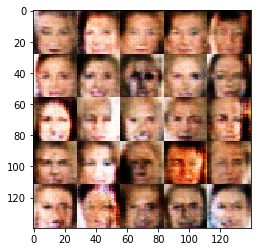

Epoch 1/5... Discriminator Loss: 1.6448... Generator Loss: 0.2713
Epoch 1/5... Discriminator Loss: 1.8344... Generator Loss: 0.2405
Epoch 1/5... Discriminator Loss: 0.9753... Generator Loss: 1.5020
Epoch 1/5... Discriminator Loss: 2.3586... Generator Loss: 1.3427
Epoch 1/5... Discriminator Loss: 0.8408... Generator Loss: 1.7603
Epoch 1/5... Discriminator Loss: 1.2414... Generator Loss: 1.0061
Epoch 1/5... Discriminator Loss: 1.3756... Generator Loss: 1.4915
Epoch 1/5... Discriminator Loss: 1.4591... Generator Loss: 0.4144
Epoch 1/5... Discriminator Loss: 1.6304... Generator Loss: 0.3718
Epoch 1/5... Discriminator Loss: 1.0395... Generator Loss: 1.0841


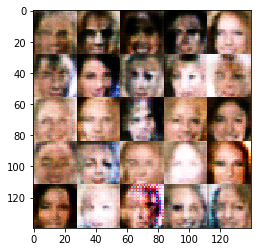

Epoch 1/5... Discriminator Loss: 1.3044... Generator Loss: 0.9864
Epoch 1/5... Discriminator Loss: 0.9633... Generator Loss: 0.9067
Epoch 1/5... Discriminator Loss: 1.4915... Generator Loss: 0.5925
Epoch 1/5... Discriminator Loss: 1.3841... Generator Loss: 0.5283
Epoch 1/5... Discriminator Loss: 1.2246... Generator Loss: 0.5685
Epoch 1/5... Discriminator Loss: 1.3879... Generator Loss: 0.7665
Epoch 1/5... Discriminator Loss: 1.3804... Generator Loss: 0.4401
Epoch 1/5... Discriminator Loss: 1.2888... Generator Loss: 0.6067
Epoch 1/5... Discriminator Loss: 0.9148... Generator Loss: 1.6203
Epoch 1/5... Discriminator Loss: 1.0402... Generator Loss: 0.7768


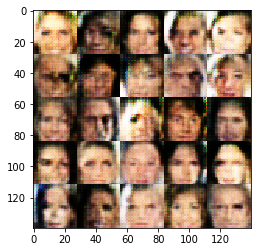

Epoch 1/5... Discriminator Loss: 1.6283... Generator Loss: 1.2256
Epoch 1/5... Discriminator Loss: 0.9029... Generator Loss: 1.7100
Epoch 1/5... Discriminator Loss: 1.0898... Generator Loss: 1.4262
Epoch 1/5... Discriminator Loss: 1.1626... Generator Loss: 1.0082
Epoch 1/5... Discriminator Loss: 1.5845... Generator Loss: 0.3946
Epoch 1/5... Discriminator Loss: 1.1877... Generator Loss: 0.7777
Epoch 1/5... Discriminator Loss: 1.1948... Generator Loss: 0.5943
Epoch 1/5... Discriminator Loss: 2.1996... Generator Loss: 0.1503
Epoch 1/5... Discriminator Loss: 1.8920... Generator Loss: 0.1966
Epoch 1/5... Discriminator Loss: 1.3488... Generator Loss: 0.5854


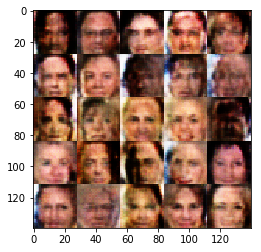

Epoch 1/5... Discriminator Loss: 1.5921... Generator Loss: 1.0243
Epoch 1/5... Discriminator Loss: 1.5412... Generator Loss: 0.8297
Epoch 1/5... Discriminator Loss: 1.4601... Generator Loss: 0.4823
Epoch 1/5... Discriminator Loss: 1.0640... Generator Loss: 0.8781
Epoch 1/5... Discriminator Loss: 2.6202... Generator Loss: 2.3359
Epoch 1/5... Discriminator Loss: 1.4480... Generator Loss: 2.5823
Epoch 1/5... Discriminator Loss: 1.4613... Generator Loss: 0.4300
Epoch 1/5... Discriminator Loss: 1.3953... Generator Loss: 0.3900
Epoch 1/5... Discriminator Loss: 0.5829... Generator Loss: 1.7426
Epoch 1/5... Discriminator Loss: 0.7601... Generator Loss: 0.9827


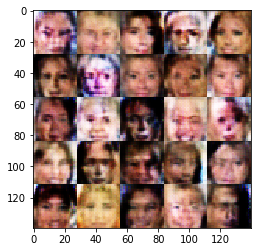

Epoch 1/5... Discriminator Loss: 1.3524... Generator Loss: 0.7881
Epoch 1/5... Discriminator Loss: 1.3298... Generator Loss: 0.5487
Epoch 1/5... Discriminator Loss: 1.2454... Generator Loss: 0.4203
Epoch 1/5... Discriminator Loss: 1.2822... Generator Loss: 0.5405
Epoch 1/5... Discriminator Loss: 1.3295... Generator Loss: 0.8862
Epoch 1/5... Discriminator Loss: 1.8321... Generator Loss: 1.8012
Epoch 1/5... Discriminator Loss: 1.1859... Generator Loss: 0.4404
Epoch 1/5... Discriminator Loss: 1.2240... Generator Loss: 0.5290
Epoch 1/5... Discriminator Loss: 1.5017... Generator Loss: 0.3809
Epoch 1/5... Discriminator Loss: 1.2340... Generator Loss: 0.5806


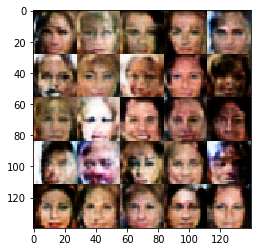

Epoch 1/5... Discriminator Loss: 1.5267... Generator Loss: 0.3038
Epoch 1/5... Discriminator Loss: 0.9983... Generator Loss: 1.2130
Epoch 1/5... Discriminator Loss: 1.1935... Generator Loss: 0.4518
Epoch 1/5... Discriminator Loss: 1.0059... Generator Loss: 0.7484
Epoch 1/5... Discriminator Loss: 2.4076... Generator Loss: 2.4090
Epoch 1/5... Discriminator Loss: 1.4022... Generator Loss: 0.3559
Epoch 1/5... Discriminator Loss: 1.7791... Generator Loss: 1.6215
Epoch 1/5... Discriminator Loss: 0.7798... Generator Loss: 1.3930
Epoch 1/5... Discriminator Loss: 1.1895... Generator Loss: 1.5162
Epoch 1/5... Discriminator Loss: 1.4337... Generator Loss: 0.4067


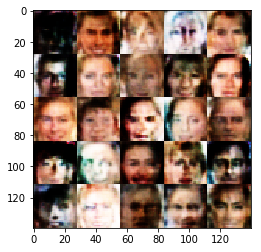

Epoch 1/5... Discriminator Loss: 0.8648... Generator Loss: 1.0647
Epoch 1/5... Discriminator Loss: 1.4546... Generator Loss: 0.3762
Epoch 1/5... Discriminator Loss: 1.5109... Generator Loss: 0.3300
Epoch 1/5... Discriminator Loss: 1.3474... Generator Loss: 0.4317
Epoch 1/5... Discriminator Loss: 1.4333... Generator Loss: 0.4706
Epoch 1/5... Discriminator Loss: 1.5448... Generator Loss: 1.0360
Epoch 1/5... Discriminator Loss: 1.5954... Generator Loss: 1.5485
Epoch 1/5... Discriminator Loss: 1.0083... Generator Loss: 0.6501
Epoch 1/5... Discriminator Loss: 0.9170... Generator Loss: 0.6521
Epoch 1/5... Discriminator Loss: 0.7428... Generator Loss: 2.2544


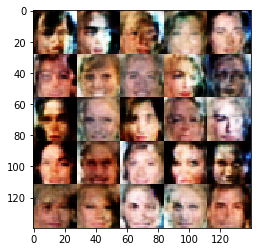

Epoch 1/5... Discriminator Loss: 1.6855... Generator Loss: 0.5557
Epoch 1/5... Discriminator Loss: 1.4125... Generator Loss: 0.6376
Epoch 1/5... Discriminator Loss: 1.1239... Generator Loss: 0.7083
Epoch 1/5... Discriminator Loss: 1.6910... Generator Loss: 1.4725
Epoch 1/5... Discriminator Loss: 1.6076... Generator Loss: 1.7227
Epoch 1/5... Discriminator Loss: 1.5891... Generator Loss: 0.2828
Epoch 1/5... Discriminator Loss: 1.5921... Generator Loss: 0.3750
Epoch 1/5... Discriminator Loss: 1.0346... Generator Loss: 1.7638
Epoch 1/5... Discriminator Loss: 1.1510... Generator Loss: 0.6424
Epoch 1/5... Discriminator Loss: 0.9719... Generator Loss: 0.8313


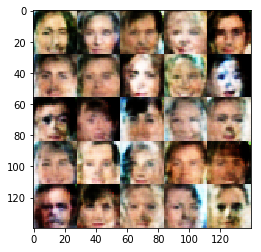

Epoch 1/5... Discriminator Loss: 0.7785... Generator Loss: 1.6134
Epoch 1/5... Discriminator Loss: 1.3311... Generator Loss: 0.6715
Epoch 1/5... Discriminator Loss: 1.5556... Generator Loss: 0.5194
Epoch 1/5... Discriminator Loss: 1.3092... Generator Loss: 0.5558
Epoch 1/5... Discriminator Loss: 1.3021... Generator Loss: 0.4490
Epoch 1/5... Discriminator Loss: 2.4505... Generator Loss: 2.2509
Epoch 1/5... Discriminator Loss: 0.9614... Generator Loss: 0.6570
Epoch 1/5... Discriminator Loss: 1.4276... Generator Loss: 0.4532
Epoch 1/5... Discriminator Loss: 1.5386... Generator Loss: 0.8745
Epoch 1/5... Discriminator Loss: 1.2893... Generator Loss: 0.5329


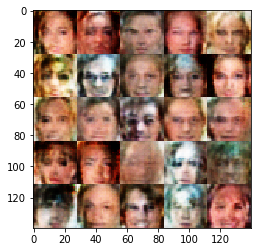

Epoch 1/5... Discriminator Loss: 1.1727... Generator Loss: 0.8592
Epoch 1/5... Discriminator Loss: 1.4401... Generator Loss: 0.3895
Epoch 1/5... Discriminator Loss: 0.7617... Generator Loss: 1.6764
Epoch 1/5... Discriminator Loss: 1.2270... Generator Loss: 0.5814
Epoch 1/5... Discriminator Loss: 1.5240... Generator Loss: 0.5353
Epoch 1/5... Discriminator Loss: 1.3530... Generator Loss: 0.7444
Epoch 1/5... Discriminator Loss: 1.4405... Generator Loss: 0.5411
Epoch 1/5... Discriminator Loss: 1.3258... Generator Loss: 0.7026
Epoch 1/5... Discriminator Loss: 1.3367... Generator Loss: 0.5978
Epoch 1/5... Discriminator Loss: 1.1492... Generator Loss: 1.0587


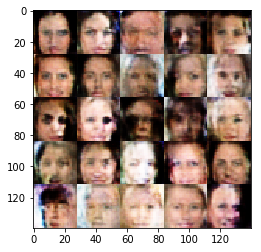

Epoch 1/5... Discriminator Loss: 1.3469... Generator Loss: 0.8808
Epoch 1/5... Discriminator Loss: 1.0548... Generator Loss: 0.7607
Epoch 1/5... Discriminator Loss: 1.3550... Generator Loss: 1.4683
Epoch 1/5... Discriminator Loss: 1.0799... Generator Loss: 0.6426
Epoch 1/5... Discriminator Loss: 1.5891... Generator Loss: 0.3066
Epoch 1/5... Discriminator Loss: 1.2682... Generator Loss: 0.6819
Epoch 1/5... Discriminator Loss: 1.0865... Generator Loss: 0.7850
Epoch 1/5... Discriminator Loss: 1.2431... Generator Loss: 0.6433
Epoch 1/5... Discriminator Loss: 1.3954... Generator Loss: 0.4928
Epoch 1/5... Discriminator Loss: 1.2753... Generator Loss: 0.5757


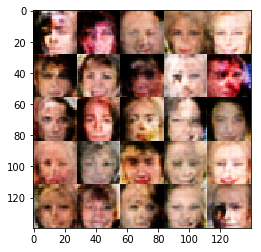

Epoch 1/5... Discriminator Loss: 0.9831... Generator Loss: 1.3194
Epoch 1/5... Discriminator Loss: 1.3497... Generator Loss: 1.0539
Epoch 1/5... Discriminator Loss: 1.1487... Generator Loss: 0.8322
Epoch 1/5... Discriminator Loss: 1.1601... Generator Loss: 0.8700
Epoch 1/5... Discriminator Loss: 1.2209... Generator Loss: 0.5440
Epoch 1/5... Discriminator Loss: 1.4616... Generator Loss: 0.4205
Epoch 1/5... Discriminator Loss: 1.4961... Generator Loss: 0.4946
Epoch 1/5... Discriminator Loss: 1.2568... Generator Loss: 0.8141
Epoch 1/5... Discriminator Loss: 1.5712... Generator Loss: 0.4732
Epoch 1/5... Discriminator Loss: 0.8757... Generator Loss: 1.3114


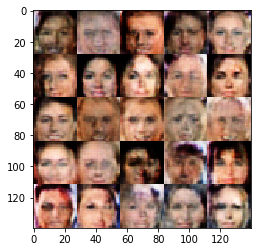

Epoch 1/5... Discriminator Loss: 1.3592... Generator Loss: 0.4225
Epoch 1/5... Discriminator Loss: 1.1971... Generator Loss: 1.3312
Epoch 1/5... Discriminator Loss: 1.5194... Generator Loss: 1.2440
Epoch 1/5... Discriminator Loss: 1.2142... Generator Loss: 0.6442
Epoch 1/5... Discriminator Loss: 0.9264... Generator Loss: 1.0337
Epoch 1/5... Discriminator Loss: 1.5788... Generator Loss: 1.4078
Epoch 1/5... Discriminator Loss: 1.3795... Generator Loss: 1.5657
Epoch 1/5... Discriminator Loss: 1.2062... Generator Loss: 0.5364
Epoch 1/5... Discriminator Loss: 1.9357... Generator Loss: 1.9389
Epoch 1/5... Discriminator Loss: 1.3584... Generator Loss: 0.7066


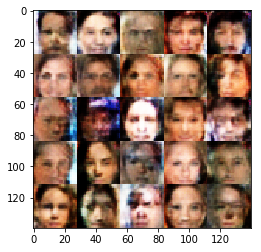

Epoch 1/5... Discriminator Loss: 1.2118... Generator Loss: 0.8900
Epoch 1/5... Discriminator Loss: 1.2859... Generator Loss: 0.8197
Epoch 1/5... Discriminator Loss: 1.2472... Generator Loss: 1.1771
Epoch 1/5... Discriminator Loss: 0.8645... Generator Loss: 0.8529
Epoch 1/5... Discriminator Loss: 1.4758... Generator Loss: 1.0899
Epoch 1/5... Discriminator Loss: 1.7160... Generator Loss: 0.2490
Epoch 1/5... Discriminator Loss: 1.6822... Generator Loss: 0.2833
Epoch 1/5... Discriminator Loss: 0.9295... Generator Loss: 1.3233
Epoch 1/5... Discriminator Loss: 1.0953... Generator Loss: 0.6432
Epoch 1/5... Discriminator Loss: 1.3897... Generator Loss: 0.5593


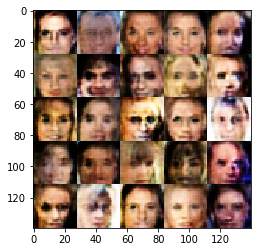

Epoch 1/5... Discriminator Loss: 1.0997... Generator Loss: 0.8934
Epoch 1/5... Discriminator Loss: 1.4010... Generator Loss: 0.7782
Epoch 1/5... Discriminator Loss: 1.1250... Generator Loss: 0.7094
Epoch 1/5... Discriminator Loss: 2.1163... Generator Loss: 1.9450
Epoch 1/5... Discriminator Loss: 1.5162... Generator Loss: 0.3312
Epoch 1/5... Discriminator Loss: 1.4796... Generator Loss: 0.5585
Epoch 1/5... Discriminator Loss: 1.3556... Generator Loss: 1.0608
Epoch 1/5... Discriminator Loss: 1.6269... Generator Loss: 0.3345
Epoch 1/5... Discriminator Loss: 1.1087... Generator Loss: 0.7281
Epoch 1/5... Discriminator Loss: 1.3708... Generator Loss: 0.6591


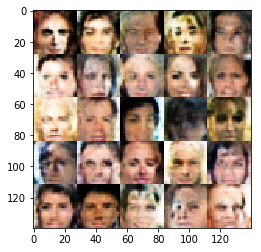

Epoch 1/5... Discriminator Loss: 1.4357... Generator Loss: 1.1157
Epoch 1/5... Discriminator Loss: 1.2400... Generator Loss: 0.9746
Epoch 1/5... Discriminator Loss: 1.2218... Generator Loss: 0.6215
Epoch 1/5... Discriminator Loss: 1.6638... Generator Loss: 0.2695
Epoch 1/5... Discriminator Loss: 1.0659... Generator Loss: 1.1661
Epoch 1/5... Discriminator Loss: 1.3745... Generator Loss: 0.9704
Epoch 1/5... Discriminator Loss: 1.0425... Generator Loss: 1.0286
Epoch 1/5... Discriminator Loss: 1.2973... Generator Loss: 0.8671
Epoch 1/5... Discriminator Loss: 1.3418... Generator Loss: 0.6717
Epoch 1/5... Discriminator Loss: 1.6114... Generator Loss: 1.3411


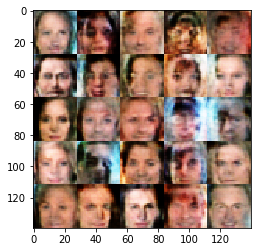

Epoch 1/5... Discriminator Loss: 1.2714... Generator Loss: 1.2839
Epoch 1/5... Discriminator Loss: 1.1424... Generator Loss: 1.1167
Epoch 1/5... Discriminator Loss: 1.1515... Generator Loss: 1.1398
Epoch 1/5... Discriminator Loss: 1.4025... Generator Loss: 0.9122
Epoch 1/5... Discriminator Loss: 1.3154... Generator Loss: 0.6300
Epoch 1/5... Discriminator Loss: 1.6332... Generator Loss: 0.3299
Epoch 1/5... Discriminator Loss: 0.9295... Generator Loss: 1.1246
Epoch 1/5... Discriminator Loss: 1.4644... Generator Loss: 0.4579
Epoch 1/5... Discriminator Loss: 1.4739... Generator Loss: 0.3726
Epoch 1/5... Discriminator Loss: 1.0249... Generator Loss: 0.9148


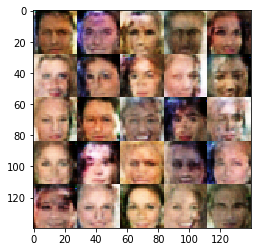

Epoch 1/5... Discriminator Loss: 0.9052... Generator Loss: 0.9586
Epoch 1/5... Discriminator Loss: 1.5242... Generator Loss: 0.3949
Epoch 1/5... Discriminator Loss: 1.1746... Generator Loss: 0.7437
Epoch 1/5... Discriminator Loss: 1.3327... Generator Loss: 0.4943
Epoch 1/5... Discriminator Loss: 1.3381... Generator Loss: 1.1912
Epoch 1/5... Discriminator Loss: 1.1774... Generator Loss: 0.7802
Epoch 1/5... Discriminator Loss: 0.9189... Generator Loss: 0.8152
Epoch 1/5... Discriminator Loss: 1.2725... Generator Loss: 0.6749
Epoch 1/5... Discriminator Loss: 1.2868... Generator Loss: 0.6273
Epoch 1/5... Discriminator Loss: 1.5061... Generator Loss: 0.3687


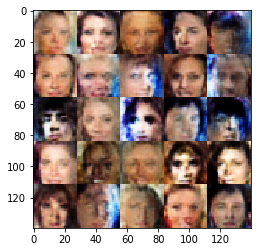

Epoch 1/5... Discriminator Loss: 1.4198... Generator Loss: 0.3579
Epoch 1/5... Discriminator Loss: 1.4385... Generator Loss: 0.3966
Epoch 1/5... Discriminator Loss: 1.2497... Generator Loss: 0.5162
Epoch 1/5... Discriminator Loss: 1.3096... Generator Loss: 0.9554
Epoch 1/5... Discriminator Loss: 0.9785... Generator Loss: 1.1010
Epoch 1/5... Discriminator Loss: 1.2693... Generator Loss: 0.9439
Epoch 1/5... Discriminator Loss: 1.0361... Generator Loss: 1.0714
Epoch 1/5... Discriminator Loss: 1.1960... Generator Loss: 0.7246
Epoch 1/5... Discriminator Loss: 1.2285... Generator Loss: 1.0293
Epoch 1/5... Discriminator Loss: 1.3485... Generator Loss: 0.5756


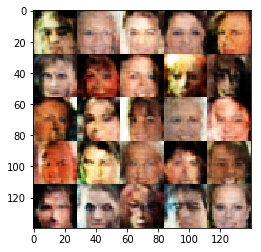

Epoch 1/5... Discriminator Loss: 1.3526... Generator Loss: 0.4920
Epoch 1/5... Discriminator Loss: 0.7905... Generator Loss: 1.1005
Epoch 1/5... Discriminator Loss: 1.6576... Generator Loss: 0.2967
Epoch 1/5... Discriminator Loss: 1.4486... Generator Loss: 0.4390
Epoch 1/5... Discriminator Loss: 1.2053... Generator Loss: 1.2855
Epoch 1/5... Discriminator Loss: 1.3015... Generator Loss: 0.7742
Epoch 1/5... Discriminator Loss: 1.3224... Generator Loss: 0.7745
Epoch 1/5... Discriminator Loss: 1.0822... Generator Loss: 0.9183
Epoch 1/5... Discriminator Loss: 1.3554... Generator Loss: 1.0377
Epoch 1/5... Discriminator Loss: 1.5928... Generator Loss: 0.3275


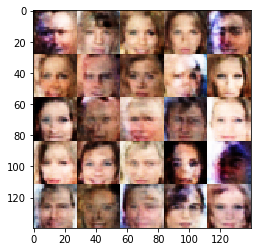

Epoch 1/5... Discriminator Loss: 1.4129... Generator Loss: 0.4511
Epoch 1/5... Discriminator Loss: 1.5995... Generator Loss: 1.3784
Epoch 1/5... Discriminator Loss: 1.1073... Generator Loss: 0.6770
Epoch 1/5... Discriminator Loss: 1.3423... Generator Loss: 0.7078
Epoch 1/5... Discriminator Loss: 1.4885... Generator Loss: 0.5497
Epoch 1/5... Discriminator Loss: 1.3596... Generator Loss: 0.7933
Epoch 1/5... Discriminator Loss: 1.2480... Generator Loss: 0.9339
Epoch 1/5... Discriminator Loss: 1.4072... Generator Loss: 1.0781
Epoch 1/5... Discriminator Loss: 0.9037... Generator Loss: 0.9283
Epoch 1/5... Discriminator Loss: 1.2777... Generator Loss: 0.7573


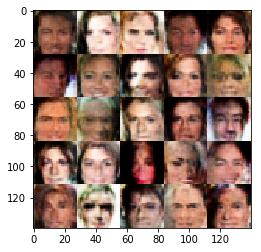

Epoch 1/5... Discriminator Loss: 1.4077... Generator Loss: 0.9566
Epoch 1/5... Discriminator Loss: 1.3776... Generator Loss: 0.5674
Epoch 1/5... Discriminator Loss: 1.4290... Generator Loss: 0.3751
Epoch 1/5... Discriminator Loss: 1.3888... Generator Loss: 1.3065
Epoch 1/5... Discriminator Loss: 1.1934... Generator Loss: 0.6974
Epoch 1/5... Discriminator Loss: 1.2398... Generator Loss: 0.7341
Epoch 1/5... Discriminator Loss: 1.4072... Generator Loss: 0.4968
Epoch 1/5... Discriminator Loss: 1.3706... Generator Loss: 0.7041
Epoch 1/5... Discriminator Loss: 1.3781... Generator Loss: 0.6073
Epoch 1/5... Discriminator Loss: 1.3544... Generator Loss: 1.0842


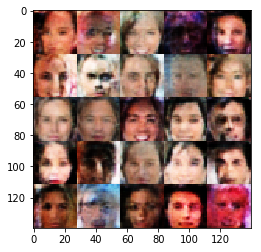

Epoch 1/5... Discriminator Loss: 1.2857... Generator Loss: 1.1884
Epoch 1/5... Discriminator Loss: 1.0872... Generator Loss: 1.0466
Epoch 1/5... Discriminator Loss: 1.3917... Generator Loss: 0.6742
Epoch 1/5... Discriminator Loss: 1.2034... Generator Loss: 0.7883
Epoch 1/5... Discriminator Loss: 1.1091... Generator Loss: 0.7147
Epoch 1/5... Discriminator Loss: 1.3421... Generator Loss: 0.5603
Epoch 1/5... Discriminator Loss: 1.2440... Generator Loss: 0.5801
Epoch 1/5... Discriminator Loss: 1.2892... Generator Loss: 0.4679
Epoch 1/5... Discriminator Loss: 1.2717... Generator Loss: 0.7335
Epoch 1/5... Discriminator Loss: 1.5122... Generator Loss: 0.3902


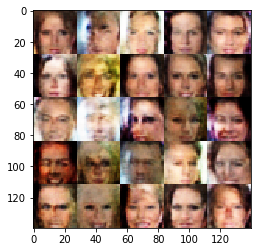

Epoch 1/5... Discriminator Loss: 1.5299... Generator Loss: 0.3571
Epoch 1/5... Discriminator Loss: 1.0762... Generator Loss: 0.9500
Epoch 1/5... Discriminator Loss: 1.2398... Generator Loss: 0.6774
Epoch 1/5... Discriminator Loss: 1.0653... Generator Loss: 0.7367
Epoch 1/5... Discriminator Loss: 0.7803... Generator Loss: 1.0791
Epoch 1/5... Discriminator Loss: 1.4603... Generator Loss: 0.3804
Epoch 1/5... Discriminator Loss: 1.1638... Generator Loss: 0.6063
Epoch 1/5... Discriminator Loss: 1.4640... Generator Loss: 0.5548
Epoch 1/5... Discriminator Loss: 1.3943... Generator Loss: 0.6273
Epoch 1/5... Discriminator Loss: 1.3453... Generator Loss: 0.4916


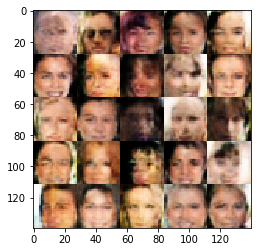

Epoch 1/5... Discriminator Loss: 1.1318... Generator Loss: 0.9427
Epoch 1/5... Discriminator Loss: 1.4266... Generator Loss: 1.0942
Epoch 1/5... Discriminator Loss: 1.1529... Generator Loss: 0.7625
Epoch 1/5... Discriminator Loss: 1.5413... Generator Loss: 1.1740
Epoch 1/5... Discriminator Loss: 1.0646... Generator Loss: 0.8921
Epoch 1/5... Discriminator Loss: 1.3160... Generator Loss: 1.0731
Epoch 1/5... Discriminator Loss: 1.3645... Generator Loss: 0.4668
Epoch 1/5... Discriminator Loss: 1.3639... Generator Loss: 0.6087
Epoch 1/5... Discriminator Loss: 1.0760... Generator Loss: 0.8088
Epoch 1/5... Discriminator Loss: 1.2944... Generator Loss: 0.8195


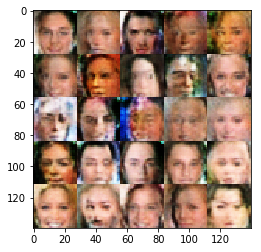

Epoch 1/5... Discriminator Loss: 1.5554... Generator Loss: 0.6383
Epoch 1/5... Discriminator Loss: 1.3523... Generator Loss: 0.7094
Epoch 1/5... Discriminator Loss: 1.1075... Generator Loss: 0.6298
Epoch 1/5... Discriminator Loss: 1.3164... Generator Loss: 0.9341
Epoch 1/5... Discriminator Loss: 1.2866... Generator Loss: 0.3985
Epoch 1/5... Discriminator Loss: 1.2480... Generator Loss: 0.5745
Epoch 1/5... Discriminator Loss: 1.2821... Generator Loss: 0.5842
Epoch 1/5... Discriminator Loss: 1.3090... Generator Loss: 0.8132
Epoch 1/5... Discriminator Loss: 1.6044... Generator Loss: 0.3021
Epoch 1/5... Discriminator Loss: 1.3301... Generator Loss: 0.6020


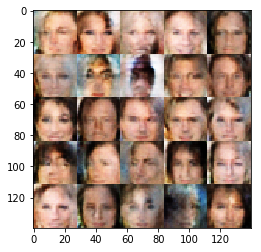

Epoch 1/5... Discriminator Loss: 1.4139... Generator Loss: 0.9403
Epoch 1/5... Discriminator Loss: 1.1985... Generator Loss: 0.6700
Epoch 1/5... Discriminator Loss: 1.2712... Generator Loss: 0.7935
Epoch 1/5... Discriminator Loss: 1.2816... Generator Loss: 0.6175
Epoch 1/5... Discriminator Loss: 1.2952... Generator Loss: 0.7714
Epoch 1/5... Discriminator Loss: 1.0059... Generator Loss: 0.9070
Epoch 1/5... Discriminator Loss: 1.5702... Generator Loss: 0.3045
Epoch 1/5... Discriminator Loss: 1.3572... Generator Loss: 0.7869
Epoch 1/5... Discriminator Loss: 1.3573... Generator Loss: 0.4767
Epoch 1/5... Discriminator Loss: 1.4578... Generator Loss: 0.4006


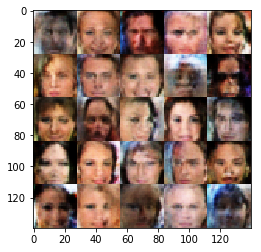

Epoch 1/5... Discriminator Loss: 1.1875... Generator Loss: 0.6592
Epoch 1/5... Discriminator Loss: 1.3591... Generator Loss: 1.2658
Epoch 1/5... Discriminator Loss: 1.4248... Generator Loss: 0.4844
Epoch 1/5... Discriminator Loss: 1.2472... Generator Loss: 0.6768
Epoch 1/5... Discriminator Loss: 1.2116... Generator Loss: 0.9893
Epoch 1/5... Discriminator Loss: 1.4055... Generator Loss: 0.4481
Epoch 1/5... Discriminator Loss: 1.0363... Generator Loss: 1.2470
Epoch 1/5... Discriminator Loss: 1.3313... Generator Loss: 0.6415
Epoch 1/5... Discriminator Loss: 1.2867... Generator Loss: 0.6631
Epoch 1/5... Discriminator Loss: 1.2743... Generator Loss: 0.7451


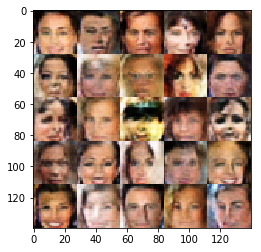

Epoch 1/5... Discriminator Loss: 1.4437... Generator Loss: 0.9991
Epoch 1/5... Discriminator Loss: 1.1903... Generator Loss: 0.7025
Epoch 1/5... Discriminator Loss: 1.4061... Generator Loss: 0.4162
Epoch 1/5... Discriminator Loss: 1.2936... Generator Loss: 1.2572
Epoch 1/5... Discriminator Loss: 1.3167... Generator Loss: 0.7353
Epoch 1/5... Discriminator Loss: 1.3188... Generator Loss: 0.5051
Epoch 1/5... Discriminator Loss: 1.1698... Generator Loss: 1.1538
Epoch 1/5... Discriminator Loss: 1.3251... Generator Loss: 0.6230
Epoch 1/5... Discriminator Loss: 1.1000... Generator Loss: 0.7221
Epoch 1/5... Discriminator Loss: 1.1618... Generator Loss: 1.0776


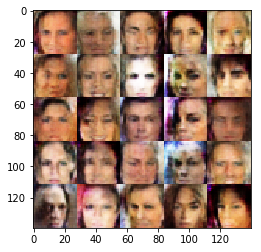

Epoch 1/5... Discriminator Loss: 1.4274... Generator Loss: 0.3861
Epoch 1/5... Discriminator Loss: 1.1644... Generator Loss: 0.7637
Epoch 1/5... Discriminator Loss: 1.3351... Generator Loss: 1.0166
Epoch 1/5... Discriminator Loss: 1.3595... Generator Loss: 0.7964
Epoch 1/5... Discriminator Loss: 1.1893... Generator Loss: 1.3052
Epoch 1/5... Discriminator Loss: 1.3057... Generator Loss: 0.5307
Epoch 1/5... Discriminator Loss: 1.3451... Generator Loss: 0.6262
Epoch 1/5... Discriminator Loss: 1.0632... Generator Loss: 0.7111
Epoch 1/5... Discriminator Loss: 1.1569... Generator Loss: 0.7700
Epoch 1/5... Discriminator Loss: 1.1027... Generator Loss: 0.8591


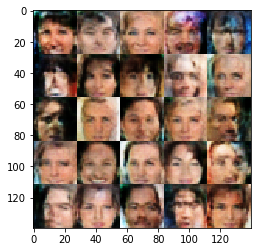

Epoch 1/5... Discriminator Loss: 1.4058... Generator Loss: 1.1424
Epoch 1/5... Discriminator Loss: 1.2812... Generator Loss: 0.9123
Epoch 1/5... Discriminator Loss: 1.5964... Generator Loss: 1.0587
Epoch 1/5... Discriminator Loss: 1.6869... Generator Loss: 0.2873
Epoch 1/5... Discriminator Loss: 1.2138... Generator Loss: 0.9687
Epoch 1/5... Discriminator Loss: 1.5330... Generator Loss: 1.3551
Epoch 1/5... Discriminator Loss: 1.2590... Generator Loss: 0.7760
Epoch 1/5... Discriminator Loss: 1.2746... Generator Loss: 0.7174
Epoch 1/5... Discriminator Loss: 1.3353... Generator Loss: 0.6203
Epoch 1/5... Discriminator Loss: 1.2886... Generator Loss: 0.9679


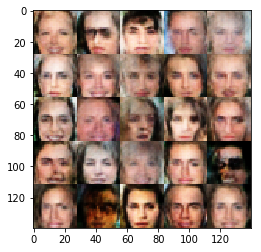

Epoch 1/5... Discriminator Loss: 1.2495... Generator Loss: 0.7386
Epoch 1/5... Discriminator Loss: 1.5880... Generator Loss: 1.4926
Epoch 1/5... Discriminator Loss: 1.4106... Generator Loss: 0.6148
Epoch 1/5... Discriminator Loss: 1.1815... Generator Loss: 1.0832
Epoch 1/5... Discriminator Loss: 1.2162... Generator Loss: 0.7277
Epoch 1/5... Discriminator Loss: 1.3539... Generator Loss: 0.7171
Epoch 1/5... Discriminator Loss: 1.3787... Generator Loss: 0.4777
Epoch 1/5... Discriminator Loss: 1.3821... Generator Loss: 0.4958
Epoch 1/5... Discriminator Loss: 1.3003... Generator Loss: 0.5280
Epoch 1/5... Discriminator Loss: 1.4247... Generator Loss: 0.5041


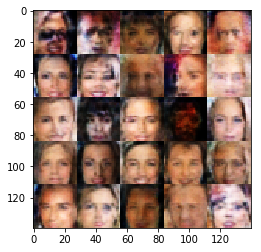

Epoch 1/5... Discriminator Loss: 0.9389... Generator Loss: 1.2299
Epoch 1/5... Discriminator Loss: 1.3494... Generator Loss: 0.8660
Epoch 1/5... Discriminator Loss: 1.2330... Generator Loss: 0.5333
Epoch 1/5... Discriminator Loss: 1.2103... Generator Loss: 0.6271
Epoch 1/5... Discriminator Loss: 1.1731... Generator Loss: 0.7732
Epoch 1/5... Discriminator Loss: 1.3762... Generator Loss: 0.5142
Epoch 1/5... Discriminator Loss: 1.4103... Generator Loss: 0.5317
Epoch 1/5... Discriminator Loss: 1.3071... Generator Loss: 0.6700
Epoch 1/5... Discriminator Loss: 1.3861... Generator Loss: 0.8133
Epoch 1/5... Discriminator Loss: 1.2866... Generator Loss: 0.8591


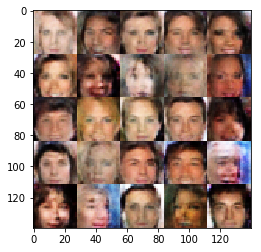

Epoch 1/5... Discriminator Loss: 1.3068... Generator Loss: 0.5038
Epoch 1/5... Discriminator Loss: 1.3749... Generator Loss: 0.6197
Epoch 1/5... Discriminator Loss: 1.4296... Generator Loss: 0.8746
Epoch 1/5... Discriminator Loss: 1.1969... Generator Loss: 0.5428
Epoch 1/5... Discriminator Loss: 1.4572... Generator Loss: 1.2157
Epoch 1/5... Discriminator Loss: 1.4180... Generator Loss: 0.4009
Epoch 1/5... Discriminator Loss: 1.3926... Generator Loss: 0.7141
Epoch 1/5... Discriminator Loss: 1.2464... Generator Loss: 1.1553
Epoch 1/5... Discriminator Loss: 1.2626... Generator Loss: 0.7144
Epoch 1/5... Discriminator Loss: 1.6035... Generator Loss: 0.3004


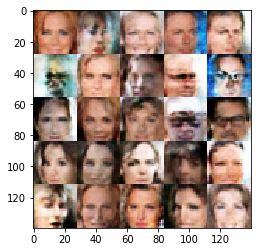

Epoch 1/5... Discriminator Loss: 1.3212... Generator Loss: 0.5495
Epoch 1/5... Discriminator Loss: 1.2876... Generator Loss: 0.8182
Epoch 1/5... Discriminator Loss: 1.2084... Generator Loss: 0.8770
Epoch 1/5... Discriminator Loss: 1.0849... Generator Loss: 0.8155
Epoch 1/5... Discriminator Loss: 1.4672... Generator Loss: 0.3784
Epoch 1/5... Discriminator Loss: 1.4346... Generator Loss: 0.4520
Epoch 1/5... Discriminator Loss: 1.2728... Generator Loss: 0.6995
Epoch 1/5... Discriminator Loss: 1.2527... Generator Loss: 1.0779
Epoch 1/5... Discriminator Loss: 1.4063... Generator Loss: 0.4262
Epoch 1/5... Discriminator Loss: 0.8218... Generator Loss: 1.3264


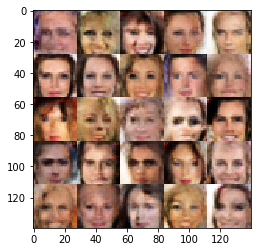

Epoch 1/5... Discriminator Loss: 1.1916... Generator Loss: 0.9497
Epoch 1/5... Discriminator Loss: 1.3505... Generator Loss: 0.5131
Epoch 1/5... Discriminator Loss: 1.3569... Generator Loss: 0.4804
Epoch 1/5... Discriminator Loss: 1.4547... Generator Loss: 0.4112
Epoch 1/5... Discriminator Loss: 1.2164... Generator Loss: 0.6806
Epoch 1/5... Discriminator Loss: 1.2604... Generator Loss: 0.7044
Epoch 1/5... Discriminator Loss: 1.3194... Generator Loss: 0.7644
Epoch 1/5... Discriminator Loss: 1.5880... Generator Loss: 0.3419
Epoch 1/5... Discriminator Loss: 1.2134... Generator Loss: 0.6902
Epoch 1/5... Discriminator Loss: 1.2841... Generator Loss: 0.9257


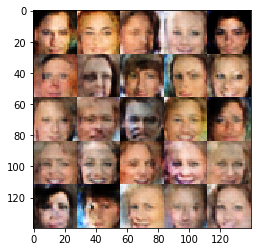

Epoch 1/5... Discriminator Loss: 1.3189... Generator Loss: 0.5812
Epoch 1/5... Discriminator Loss: 1.3689... Generator Loss: 0.4510
Epoch 1/5... Discriminator Loss: 1.2985... Generator Loss: 0.6060
Epoch 1/5... Discriminator Loss: 1.3525... Generator Loss: 0.4528
Epoch 1/5... Discriminator Loss: 1.4053... Generator Loss: 0.4355
Epoch 1/5... Discriminator Loss: 1.2658... Generator Loss: 0.5161
Epoch 1/5... Discriminator Loss: 1.2535... Generator Loss: 0.5842
Epoch 1/5... Discriminator Loss: 1.4583... Generator Loss: 0.3840
Epoch 1/5... Discriminator Loss: 1.2103... Generator Loss: 0.7709
Epoch 1/5... Discriminator Loss: 1.3348... Generator Loss: 0.5097


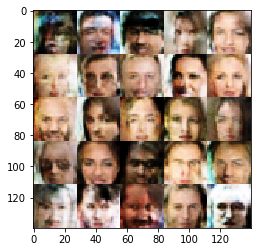

Epoch 1/5... Discriminator Loss: 1.5236... Generator Loss: 0.3685
Epoch 1/5... Discriminator Loss: 0.8906... Generator Loss: 1.2741
Epoch 1/5... Discriminator Loss: 1.3686... Generator Loss: 0.8541
Epoch 1/5... Discriminator Loss: 1.4617... Generator Loss: 0.4258
Epoch 1/5... Discriminator Loss: 1.2934... Generator Loss: 0.6298
Epoch 1/5... Discriminator Loss: 1.4010... Generator Loss: 0.6548
Epoch 1/5... Discriminator Loss: 1.0857... Generator Loss: 0.9652
Epoch 1/5... Discriminator Loss: 1.2477... Generator Loss: 0.8239
Epoch 1/5... Discriminator Loss: 1.0117... Generator Loss: 0.9828
Epoch 1/5... Discriminator Loss: 1.3687... Generator Loss: 1.0637


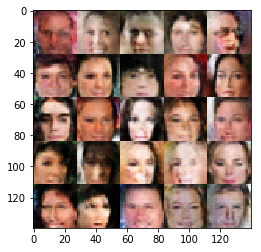

Epoch 1/5... Discriminator Loss: 1.4213... Generator Loss: 0.4936
Epoch 1/5... Discriminator Loss: 1.3142... Generator Loss: 0.9699
Epoch 1/5... Discriminator Loss: 1.1371... Generator Loss: 0.9358
Epoch 1/5... Discriminator Loss: 1.2238... Generator Loss: 0.8237
Epoch 1/5... Discriminator Loss: 1.3551... Generator Loss: 0.6247
Epoch 1/5... Discriminator Loss: 1.3519... Generator Loss: 0.7761
Epoch 1/5... Discriminator Loss: 1.1012... Generator Loss: 1.1167
Epoch 1/5... Discriminator Loss: 1.1847... Generator Loss: 0.5560
Epoch 1/5... Discriminator Loss: 1.4133... Generator Loss: 0.4579
Epoch 1/5... Discriminator Loss: 1.5440... Generator Loss: 0.3376


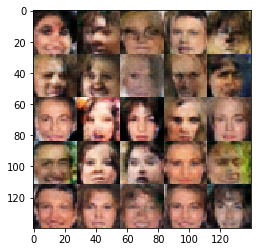

Epoch 1/5... Discriminator Loss: 1.3359... Generator Loss: 0.5114
Epoch 1/5... Discriminator Loss: 1.1994... Generator Loss: 0.5949
Epoch 1/5... Discriminator Loss: 1.5393... Generator Loss: 1.4406
Epoch 1/5... Discriminator Loss: 1.0939... Generator Loss: 0.8986
Epoch 1/5... Discriminator Loss: 1.1064... Generator Loss: 0.9402
Epoch 1/5... Discriminator Loss: 1.2962... Generator Loss: 0.8074
Epoch 1/5... Discriminator Loss: 1.4456... Generator Loss: 0.5086
Epoch 1/5... Discriminator Loss: 1.3199... Generator Loss: 0.5935
Epoch 1/5... Discriminator Loss: 1.2010... Generator Loss: 0.8391
Epoch 1/5... Discriminator Loss: 1.3530... Generator Loss: 0.5273


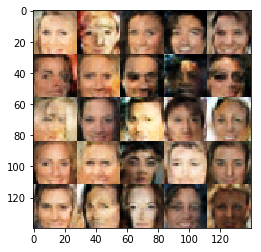

Epoch 1/5... Discriminator Loss: 1.3672... Generator Loss: 0.5332
Epoch 1/5... Discriminator Loss: 1.3507... Generator Loss: 1.0558
Epoch 1/5... Discriminator Loss: 1.3798... Generator Loss: 0.9228
Epoch 1/5... Discriminator Loss: 1.2106... Generator Loss: 0.6694
Epoch 1/5... Discriminator Loss: 1.3050... Generator Loss: 0.9430
Epoch 1/5... Discriminator Loss: 1.4093... Generator Loss: 0.4634
Epoch 1/5... Discriminator Loss: 1.3753... Generator Loss: 0.4352
Epoch 1/5... Discriminator Loss: 1.2385... Generator Loss: 0.5895
Epoch 1/5... Discriminator Loss: 1.1911... Generator Loss: 0.7453
Epoch 1/5... Discriminator Loss: 1.3839... Generator Loss: 0.4226


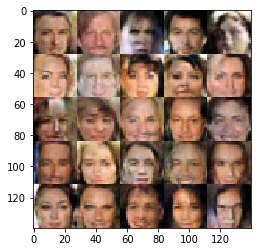

Epoch 1/5... Discriminator Loss: 1.3008... Generator Loss: 0.7335
Epoch 1/5... Discriminator Loss: 1.3305... Generator Loss: 0.6023
Epoch 1/5... Discriminator Loss: 1.2567... Generator Loss: 0.6108
Epoch 1/5... Discriminator Loss: 1.3789... Generator Loss: 0.4927
Epoch 1/5... Discriminator Loss: 1.3579... Generator Loss: 0.5818
Epoch 1/5... Discriminator Loss: 1.2253... Generator Loss: 0.7784
Epoch 1/5... Discriminator Loss: 1.4401... Generator Loss: 0.3896
Epoch 1/5... Discriminator Loss: 1.1186... Generator Loss: 0.6531
Epoch 1/5... Discriminator Loss: 1.2862... Generator Loss: 0.5971
Epoch 1/5... Discriminator Loss: 1.2180... Generator Loss: 0.6557


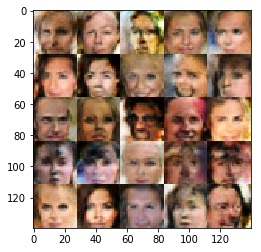

Epoch 1/5... Discriminator Loss: 1.2233... Generator Loss: 0.5698
Epoch 1/5... Discriminator Loss: 1.5540... Generator Loss: 0.3247
Epoch 1/5... Discriminator Loss: 1.1731... Generator Loss: 0.6338
Epoch 1/5... Discriminator Loss: 1.2525... Generator Loss: 0.7512
Epoch 1/5... Discriminator Loss: 1.3501... Generator Loss: 0.9932
Epoch 1/5... Discriminator Loss: 1.2507... Generator Loss: 0.5973
Epoch 1/5... Discriminator Loss: 1.2083... Generator Loss: 1.1581
Epoch 1/5... Discriminator Loss: 1.3742... Generator Loss: 0.7067
Epoch 1/5... Discriminator Loss: 1.4096... Generator Loss: 0.8246
Epoch 1/5... Discriminator Loss: 1.2892... Generator Loss: 0.4624


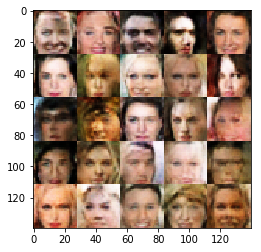

Epoch 1/5... Discriminator Loss: 1.4392... Generator Loss: 0.4362
Epoch 1/5... Discriminator Loss: 1.3099... Generator Loss: 0.4983
Epoch 1/5... Discriminator Loss: 1.2291... Generator Loss: 0.5962
Epoch 1/5... Discriminator Loss: 1.0541... Generator Loss: 0.9768
Epoch 1/5... Discriminator Loss: 1.2836... Generator Loss: 0.6053
Epoch 1/5... Discriminator Loss: 1.3732... Generator Loss: 0.5831
Epoch 1/5... Discriminator Loss: 1.3564... Generator Loss: 0.5738
Epoch 1/5... Discriminator Loss: 1.4132... Generator Loss: 0.5581
Epoch 1/5... Discriminator Loss: 1.4149... Generator Loss: 0.4380
Epoch 1/5... Discriminator Loss: 1.2961... Generator Loss: 0.7047


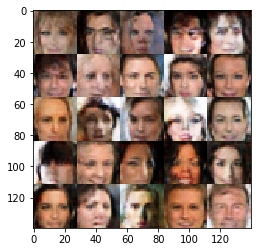

Epoch 1/5... Discriminator Loss: 1.2723... Generator Loss: 0.7442
Epoch 1/5... Discriminator Loss: 1.2891... Generator Loss: 0.5260
Epoch 1/5... Discriminator Loss: 1.3972... Generator Loss: 0.9211
Epoch 1/5... Discriminator Loss: 1.3034... Generator Loss: 0.7169
Epoch 1/5... Discriminator Loss: 1.2709... Generator Loss: 0.6870
Epoch 1/5... Discriminator Loss: 1.1679... Generator Loss: 1.0825
Epoch 1/5... Discriminator Loss: 1.2434... Generator Loss: 0.6339
Epoch 1/5... Discriminator Loss: 1.2923... Generator Loss: 0.7703
Epoch 1/5... Discriminator Loss: 1.2098... Generator Loss: 0.7367
Epoch 1/5... Discriminator Loss: 1.1833... Generator Loss: 0.6010


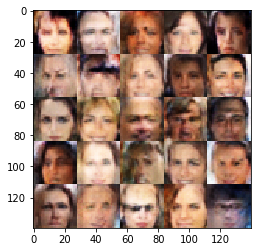

Epoch 1/5... Discriminator Loss: 1.3633... Generator Loss: 0.4838
Epoch 1/5... Discriminator Loss: 1.2747... Generator Loss: 0.5995
Epoch 1/5... Discriminator Loss: 1.2419... Generator Loss: 0.5723
Epoch 1/5... Discriminator Loss: 1.2176... Generator Loss: 0.6139
Epoch 1/5... Discriminator Loss: 1.3331... Generator Loss: 0.8714
Epoch 1/5... Discriminator Loss: 1.3402... Generator Loss: 0.7150
Epoch 1/5... Discriminator Loss: 1.4231... Generator Loss: 0.8425
Epoch 1/5... Discriminator Loss: 1.1614... Generator Loss: 0.9792
Epoch 1/5... Discriminator Loss: 1.2924... Generator Loss: 0.6030
Epoch 1/5... Discriminator Loss: 1.1797... Generator Loss: 0.5998


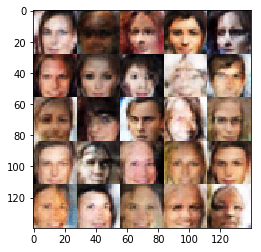

Epoch 1/5... Discriminator Loss: 1.3404... Generator Loss: 0.8531
Epoch 1/5... Discriminator Loss: 1.2761... Generator Loss: 0.6307
Epoch 1/5... Discriminator Loss: 1.3999... Generator Loss: 0.4349
Epoch 1/5... Discriminator Loss: 1.1866... Generator Loss: 0.9427
Epoch 1/5... Discriminator Loss: 1.1912... Generator Loss: 0.7364
Epoch 1/5... Discriminator Loss: 1.1090... Generator Loss: 0.7059
Epoch 1/5... Discriminator Loss: 1.2757... Generator Loss: 0.8400
Epoch 1/5... Discriminator Loss: 1.2869... Generator Loss: 0.5599
Epoch 1/5... Discriminator Loss: 1.1393... Generator Loss: 0.7028
Epoch 1/5... Discriminator Loss: 1.4093... Generator Loss: 1.0968


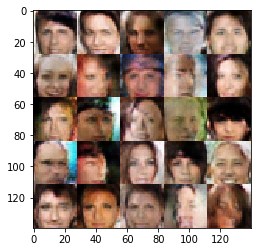

Epoch 1/5... Discriminator Loss: 1.3477... Generator Loss: 0.5851
Epoch 1/5... Discriminator Loss: 1.6287... Generator Loss: 0.2944
Epoch 1/5... Discriminator Loss: 1.1049... Generator Loss: 0.8856
Epoch 1/5... Discriminator Loss: 1.2362... Generator Loss: 0.5923
Epoch 1/5... Discriminator Loss: 1.4764... Generator Loss: 0.4922
Epoch 1/5... Discriminator Loss: 1.5072... Generator Loss: 0.3747
Epoch 1/5... Discriminator Loss: 1.3314... Generator Loss: 0.7585
Epoch 1/5... Discriminator Loss: 1.1912... Generator Loss: 0.6427
Epoch 1/5... Discriminator Loss: 1.3568... Generator Loss: 0.4970
Epoch 1/5... Discriminator Loss: 1.3393... Generator Loss: 0.6559


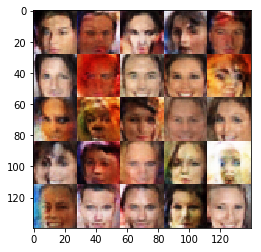

Epoch 1/5... Discriminator Loss: 1.3314... Generator Loss: 0.5856
Epoch 1/5... Discriminator Loss: 1.2599... Generator Loss: 0.6290
Epoch 1/5... Discriminator Loss: 1.2259... Generator Loss: 0.8748
Epoch 1/5... Discriminator Loss: 1.5356... Generator Loss: 0.3191
Epoch 1/5... Discriminator Loss: 1.3611... Generator Loss: 0.7236
Epoch 1/5... Discriminator Loss: 1.3398... Generator Loss: 0.5107
Epoch 1/5... Discriminator Loss: 1.1771... Generator Loss: 0.6078
Epoch 1/5... Discriminator Loss: 1.3349... Generator Loss: 0.7024
Epoch 1/5... Discriminator Loss: 1.2374... Generator Loss: 0.5780
Epoch 1/5... Discriminator Loss: 1.3897... Generator Loss: 0.9805


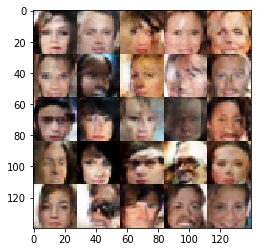

Epoch 1/5... Discriminator Loss: 1.6213... Generator Loss: 0.3220
Epoch 1/5... Discriminator Loss: 1.4358... Generator Loss: 0.4052
Epoch 1/5... Discriminator Loss: 1.3139... Generator Loss: 0.4987
Epoch 1/5... Discriminator Loss: 1.2627... Generator Loss: 0.5655
Epoch 1/5... Discriminator Loss: 1.2612... Generator Loss: 0.7274
Epoch 1/5... Discriminator Loss: 1.0800... Generator Loss: 1.0737
Epoch 1/5... Discriminator Loss: 1.4141... Generator Loss: 0.4179
Epoch 1/5... Discriminator Loss: 1.4210... Generator Loss: 0.3904
Epoch 1/5... Discriminator Loss: 1.1787... Generator Loss: 0.7263
Epoch 1/5... Discriminator Loss: 1.2731... Generator Loss: 0.9453


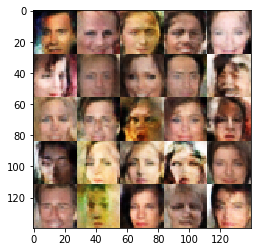

Epoch 1/5... Discriminator Loss: 1.3466... Generator Loss: 0.4600
Epoch 1/5... Discriminator Loss: 1.3341... Generator Loss: 0.6591
Epoch 1/5... Discriminator Loss: 1.5445... Generator Loss: 0.3567
Epoch 1/5... Discriminator Loss: 1.4120... Generator Loss: 0.4063
Epoch 1/5... Discriminator Loss: 1.2703... Generator Loss: 0.8276
Epoch 1/5... Discriminator Loss: 1.3432... Generator Loss: 0.5501
Epoch 1/5... Discriminator Loss: 1.2625... Generator Loss: 0.7228
Epoch 1/5... Discriminator Loss: 1.3443... Generator Loss: 0.4667
Epoch 1/5... Discriminator Loss: 1.3024... Generator Loss: 0.5498
Epoch 1/5... Discriminator Loss: 1.8952... Generator Loss: 1.7394


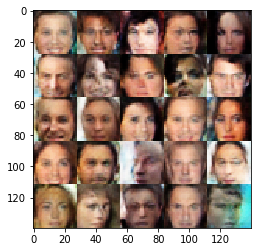

Epoch 1/5... Discriminator Loss: 1.2521... Generator Loss: 0.6442
Epoch 1/5... Discriminator Loss: 1.1605... Generator Loss: 0.6612
Epoch 1/5... Discriminator Loss: 1.3860... Generator Loss: 0.4438
Epoch 1/5... Discriminator Loss: 1.1845... Generator Loss: 0.5229
Epoch 1/5... Discriminator Loss: 1.4723... Generator Loss: 0.3527
Epoch 1/5... Discriminator Loss: 1.1999... Generator Loss: 0.9328
Epoch 1/5... Discriminator Loss: 1.1445... Generator Loss: 0.6652
Epoch 1/5... Discriminator Loss: 1.3343... Generator Loss: 0.4505
Epoch 1/5... Discriminator Loss: 1.3985... Generator Loss: 0.4382
Epoch 1/5... Discriminator Loss: 1.3841... Generator Loss: 0.4547


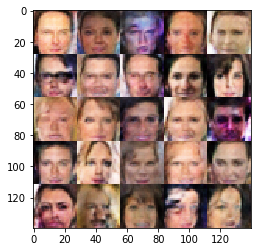

Epoch 1/5... Discriminator Loss: 1.2803... Generator Loss: 0.8793
Epoch 1/5... Discriminator Loss: 1.2911... Generator Loss: 0.6417
Epoch 1/5... Discriminator Loss: 1.2067... Generator Loss: 0.8759
Epoch 1/5... Discriminator Loss: 1.2894... Generator Loss: 0.6672
Epoch 1/5... Discriminator Loss: 1.3780... Generator Loss: 0.5866
Epoch 1/5... Discriminator Loss: 1.2475... Generator Loss: 0.5554
Epoch 1/5... Discriminator Loss: 1.3177... Generator Loss: 0.7188
Epoch 1/5... Discriminator Loss: 1.1461... Generator Loss: 0.7844
Epoch 1/5... Discriminator Loss: 1.2162... Generator Loss: 0.5706
Epoch 1/5... Discriminator Loss: 1.4252... Generator Loss: 0.4454


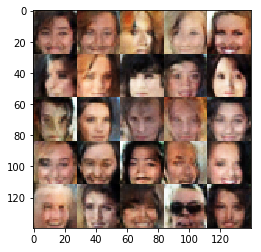

Epoch 1/5... Discriminator Loss: 1.2592... Generator Loss: 0.7772
Epoch 1/5... Discriminator Loss: 1.3728... Generator Loss: 0.5798
Epoch 1/5... Discriminator Loss: 1.3741... Generator Loss: 0.4594
Epoch 1/5... Discriminator Loss: 1.2027... Generator Loss: 0.6567
Epoch 1/5... Discriminator Loss: 1.3429... Generator Loss: 0.6394
Epoch 1/5... Discriminator Loss: 1.2410... Generator Loss: 0.7106
Epoch 1/5... Discriminator Loss: 1.3296... Generator Loss: 0.5150
Epoch 1/5... Discriminator Loss: 1.3861... Generator Loss: 0.4550
Epoch 1/5... Discriminator Loss: 1.2887... Generator Loss: 0.7432
Epoch 1/5... Discriminator Loss: 1.2082... Generator Loss: 0.7281


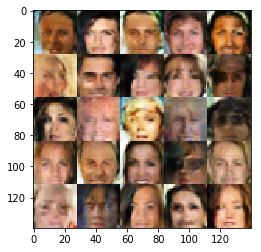

Epoch 1/5... Discriminator Loss: 1.2419... Generator Loss: 0.8894
Epoch 1/5... Discriminator Loss: 0.9716... Generator Loss: 1.3326
Epoch 1/5... Discriminator Loss: 1.4217... Generator Loss: 0.9784
Epoch 1/5... Discriminator Loss: 1.2802... Generator Loss: 0.8310
Epoch 1/5... Discriminator Loss: 1.3663... Generator Loss: 0.6533
Epoch 1/5... Discriminator Loss: 1.3430... Generator Loss: 0.4831
Epoch 1/5... Discriminator Loss: 1.3330... Generator Loss: 0.5268
Epoch 1/5... Discriminator Loss: 1.2959... Generator Loss: 0.6133
Epoch 1/5... Discriminator Loss: 1.3460... Generator Loss: 0.7217
Epoch 1/5... Discriminator Loss: 1.4240... Generator Loss: 0.4211


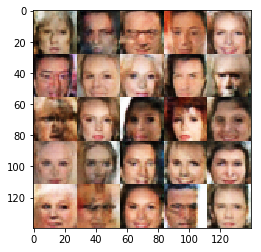

Epoch 1/5... Discriminator Loss: 1.5597... Generator Loss: 1.2120
Epoch 1/5... Discriminator Loss: 1.0175... Generator Loss: 1.0136
Epoch 1/5... Discriminator Loss: 1.2555... Generator Loss: 0.5781
Epoch 1/5... Discriminator Loss: 1.2996... Generator Loss: 0.6235
Epoch 1/5... Discriminator Loss: 1.1485... Generator Loss: 0.7143
Epoch 1/5... Discriminator Loss: 1.4833... Generator Loss: 0.3678
Epoch 1/5... Discriminator Loss: 1.3397... Generator Loss: 0.5062
Epoch 1/5... Discriminator Loss: 1.2237... Generator Loss: 0.6364
Epoch 1/5... Discriminator Loss: 1.2511... Generator Loss: 0.6284
Epoch 1/5... Discriminator Loss: 1.2901... Generator Loss: 0.4538


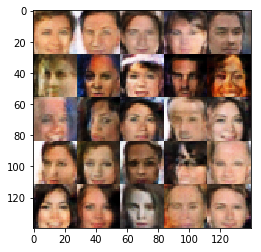

Epoch 1/5... Discriminator Loss: 1.4160... Generator Loss: 0.4018
Epoch 1/5... Discriminator Loss: 1.0770... Generator Loss: 0.6730
Epoch 1/5... Discriminator Loss: 1.1428... Generator Loss: 0.7291
Epoch 1/5... Discriminator Loss: 1.1849... Generator Loss: 0.6522
Epoch 1/5... Discriminator Loss: 1.0822... Generator Loss: 0.7458
Epoch 1/5... Discriminator Loss: 1.5299... Generator Loss: 1.2478
Epoch 1/5... Discriminator Loss: 1.2058... Generator Loss: 0.9426
Epoch 1/5... Discriminator Loss: 1.3095... Generator Loss: 0.7967
Epoch 1/5... Discriminator Loss: 1.5543... Generator Loss: 0.3337
Epoch 1/5... Discriminator Loss: 1.2660... Generator Loss: 0.6338


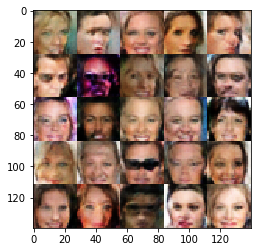

Epoch 1/5... Discriminator Loss: 1.2990... Generator Loss: 0.6823
Epoch 1/5... Discriminator Loss: 1.1810... Generator Loss: 0.8292
Epoch 1/5... Discriminator Loss: 1.2568... Generator Loss: 0.7038
Epoch 1/5... Discriminator Loss: 1.3739... Generator Loss: 0.5407
Epoch 1/5... Discriminator Loss: 1.5009... Generator Loss: 0.3715
Epoch 1/5... Discriminator Loss: 1.3490... Generator Loss: 0.7297
Epoch 1/5... Discriminator Loss: 1.3908... Generator Loss: 0.4318
Epoch 1/5... Discriminator Loss: 1.4791... Generator Loss: 0.7685
Epoch 1/5... Discriminator Loss: 1.3201... Generator Loss: 0.6078
Epoch 1/5... Discriminator Loss: 1.2089... Generator Loss: 0.7240


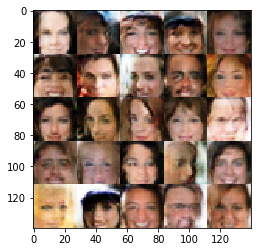

Epoch 1/5... Discriminator Loss: 1.2903... Generator Loss: 0.7633
Epoch 1/5... Discriminator Loss: 1.2967... Generator Loss: 0.6929
Epoch 1/5... Discriminator Loss: 1.2636... Generator Loss: 0.6954
Epoch 1/5... Discriminator Loss: 1.3934... Generator Loss: 0.7515
Epoch 1/5... Discriminator Loss: 1.0986... Generator Loss: 0.9475
Epoch 1/5... Discriminator Loss: 1.2888... Generator Loss: 0.6888
Epoch 1/5... Discriminator Loss: 1.1337... Generator Loss: 0.7692
Epoch 1/5... Discriminator Loss: 1.3528... Generator Loss: 0.5135
Epoch 1/5... Discriminator Loss: 1.2746... Generator Loss: 0.6467
Epoch 1/5... Discriminator Loss: 1.1898... Generator Loss: 0.6970


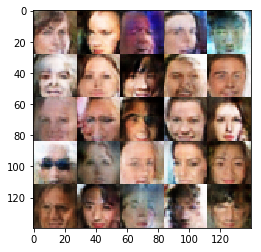

Epoch 1/5... Discriminator Loss: 0.9960... Generator Loss: 0.8877
Epoch 1/5... Discriminator Loss: 1.3665... Generator Loss: 0.4480
Epoch 1/5... Discriminator Loss: 1.1444... Generator Loss: 0.7225
Epoch 1/5... Discriminator Loss: 1.2806... Generator Loss: 0.6223
Epoch 1/5... Discriminator Loss: 1.3089... Generator Loss: 0.5542
Epoch 1/5... Discriminator Loss: 1.1749... Generator Loss: 0.6263
Epoch 1/5... Discriminator Loss: 1.2102... Generator Loss: 0.8498
Epoch 1/5... Discriminator Loss: 1.5297... Generator Loss: 0.4059
Epoch 1/5... Discriminator Loss: 1.1921... Generator Loss: 1.0796
Epoch 1/5... Discriminator Loss: 1.3537... Generator Loss: 0.4395


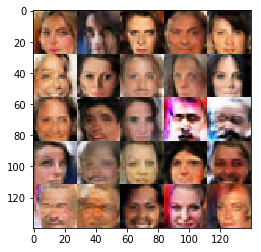

Epoch 1/5... Discriminator Loss: 1.5014... Generator Loss: 0.3629
Epoch 1/5... Discriminator Loss: 1.3062... Generator Loss: 0.6564
Epoch 1/5... Discriminator Loss: 1.0547... Generator Loss: 0.8106
Epoch 2/5... Discriminator Loss: 1.4068... Generator Loss: 0.8321
Epoch 2/5... Discriminator Loss: 1.2748... Generator Loss: 0.5526
Epoch 2/5... Discriminator Loss: 1.1712... Generator Loss: 0.6343
Epoch 2/5... Discriminator Loss: 1.2281... Generator Loss: 0.6456
Epoch 2/5... Discriminator Loss: 1.2518... Generator Loss: 0.5332
Epoch 2/5... Discriminator Loss: 1.3582... Generator Loss: 0.9374
Epoch 2/5... Discriminator Loss: 1.2955... Generator Loss: 0.5591


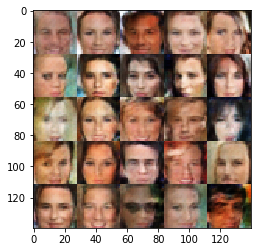

Epoch 2/5... Discriminator Loss: 1.5165... Generator Loss: 0.3927
Epoch 2/5... Discriminator Loss: 1.3467... Generator Loss: 0.5707
Epoch 2/5... Discriminator Loss: 0.9260... Generator Loss: 0.8530
Epoch 2/5... Discriminator Loss: 1.2562... Generator Loss: 0.5571
Epoch 2/5... Discriminator Loss: 1.1694... Generator Loss: 0.9336
Epoch 2/5... Discriminator Loss: 1.4649... Generator Loss: 0.3655
Epoch 2/5... Discriminator Loss: 1.2643... Generator Loss: 0.6509
Epoch 2/5... Discriminator Loss: 1.3955... Generator Loss: 0.4207
Epoch 2/5... Discriminator Loss: 1.2526... Generator Loss: 0.6634
Epoch 2/5... Discriminator Loss: 1.2738... Generator Loss: 0.5795


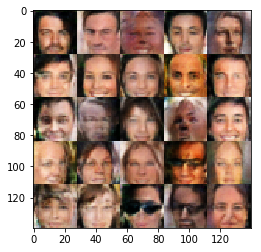

Epoch 2/5... Discriminator Loss: 1.2278... Generator Loss: 0.7091
Epoch 2/5... Discriminator Loss: 1.3439... Generator Loss: 0.6290
Epoch 2/5... Discriminator Loss: 1.3193... Generator Loss: 0.6911
Epoch 2/5... Discriminator Loss: 1.3616... Generator Loss: 0.5908
Epoch 2/5... Discriminator Loss: 1.2760... Generator Loss: 0.7566
Epoch 2/5... Discriminator Loss: 1.3565... Generator Loss: 0.8795
Epoch 2/5... Discriminator Loss: 1.2237... Generator Loss: 0.6258
Epoch 2/5... Discriminator Loss: 1.1180... Generator Loss: 0.8467
Epoch 2/5... Discriminator Loss: 1.1354... Generator Loss: 0.8317
Epoch 2/5... Discriminator Loss: 1.2094... Generator Loss: 0.7878


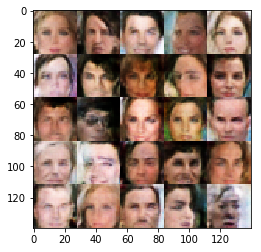

Epoch 2/5... Discriminator Loss: 1.3676... Generator Loss: 0.5867
Epoch 2/5... Discriminator Loss: 1.2192... Generator Loss: 1.0458
Epoch 2/5... Discriminator Loss: 1.3424... Generator Loss: 0.5266
Epoch 2/5... Discriminator Loss: 1.4390... Generator Loss: 0.4161
Epoch 2/5... Discriminator Loss: 1.4896... Generator Loss: 0.3645
Epoch 2/5... Discriminator Loss: 1.2919... Generator Loss: 0.6532
Epoch 2/5... Discriminator Loss: 1.2750... Generator Loss: 0.7202
Epoch 2/5... Discriminator Loss: 1.3603... Generator Loss: 0.5608
Epoch 2/5... Discriminator Loss: 1.3175... Generator Loss: 0.5076
Epoch 2/5... Discriminator Loss: 1.4504... Generator Loss: 0.4895


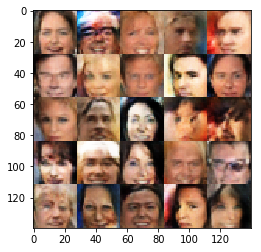

Epoch 2/5... Discriminator Loss: 1.3974... Generator Loss: 0.5086
Epoch 2/5... Discriminator Loss: 1.2425... Generator Loss: 0.8787
Epoch 2/5... Discriminator Loss: 1.3447... Generator Loss: 0.5888
Epoch 2/5... Discriminator Loss: 1.1799... Generator Loss: 0.6584
Epoch 2/5... Discriminator Loss: 1.2811... Generator Loss: 0.8612
Epoch 2/5... Discriminator Loss: 1.0951... Generator Loss: 0.8509
Epoch 2/5... Discriminator Loss: 1.2974... Generator Loss: 0.9706
Epoch 2/5... Discriminator Loss: 1.2825... Generator Loss: 0.6971
Epoch 2/5... Discriminator Loss: 1.2582... Generator Loss: 0.6722
Epoch 2/5... Discriminator Loss: 1.2823... Generator Loss: 0.9740


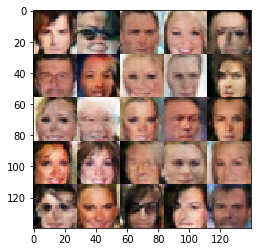

Epoch 2/5... Discriminator Loss: 1.2853... Generator Loss: 0.7723
Epoch 2/5... Discriminator Loss: 1.0271... Generator Loss: 0.7714
Epoch 2/5... Discriminator Loss: 1.3603... Generator Loss: 0.8299
Epoch 2/5... Discriminator Loss: 1.2665... Generator Loss: 0.5168
Epoch 2/5... Discriminator Loss: 1.2365... Generator Loss: 0.6278
Epoch 2/5... Discriminator Loss: 1.2413... Generator Loss: 0.5245
Epoch 2/5... Discriminator Loss: 1.3358... Generator Loss: 0.5029
Epoch 2/5... Discriminator Loss: 1.2951... Generator Loss: 0.5437
Epoch 2/5... Discriminator Loss: 1.2336... Generator Loss: 0.5533
Epoch 2/5... Discriminator Loss: 1.3625... Generator Loss: 0.8868


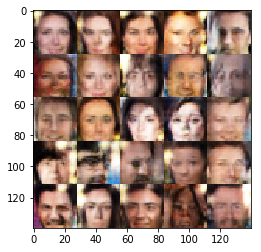

Epoch 2/5... Discriminator Loss: 1.4992... Generator Loss: 0.9929
Epoch 2/5... Discriminator Loss: 1.2541... Generator Loss: 0.6133
Epoch 2/5... Discriminator Loss: 1.1670... Generator Loss: 0.6569
Epoch 2/5... Discriminator Loss: 1.0904... Generator Loss: 0.6907
Epoch 2/5... Discriminator Loss: 1.1052... Generator Loss: 0.8078
Epoch 2/5... Discriminator Loss: 1.0597... Generator Loss: 1.1973
Epoch 2/5... Discriminator Loss: 1.1910... Generator Loss: 0.7183
Epoch 2/5... Discriminator Loss: 0.9683... Generator Loss: 1.0301
Epoch 2/5... Discriminator Loss: 1.4298... Generator Loss: 0.4689
Epoch 2/5... Discriminator Loss: 1.2593... Generator Loss: 0.6130


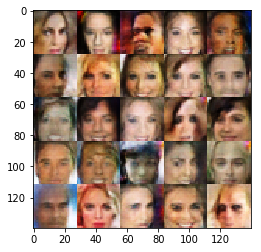

Epoch 2/5... Discriminator Loss: 1.6060... Generator Loss: 0.3099
Epoch 2/5... Discriminator Loss: 1.2466... Generator Loss: 0.5716
Epoch 2/5... Discriminator Loss: 1.3938... Generator Loss: 0.4780
Epoch 2/5... Discriminator Loss: 1.3391... Generator Loss: 0.4876
Epoch 2/5... Discriminator Loss: 1.1501... Generator Loss: 0.8302
Epoch 2/5... Discriminator Loss: 1.4082... Generator Loss: 1.3312
Epoch 2/5... Discriminator Loss: 1.1554... Generator Loss: 0.6575
Epoch 2/5... Discriminator Loss: 1.3079... Generator Loss: 0.5022
Epoch 2/5... Discriminator Loss: 1.2366... Generator Loss: 0.8320
Epoch 2/5... Discriminator Loss: 1.3017... Generator Loss: 0.5215


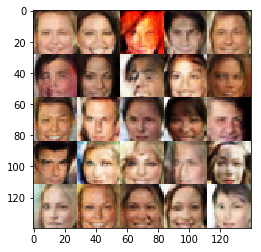

Epoch 2/5... Discriminator Loss: 1.3372... Generator Loss: 0.5387
Epoch 2/5... Discriminator Loss: 1.3347... Generator Loss: 0.5907
Epoch 2/5... Discriminator Loss: 1.1726... Generator Loss: 0.6822
Epoch 2/5... Discriminator Loss: 1.0963... Generator Loss: 0.7306
Epoch 2/5... Discriminator Loss: 1.1800... Generator Loss: 0.5084
Epoch 2/5... Discriminator Loss: 1.1809... Generator Loss: 0.6956
Epoch 2/5... Discriminator Loss: 1.0843... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.3013... Generator Loss: 0.5391
Epoch 2/5... Discriminator Loss: 1.4500... Generator Loss: 0.5209
Epoch 2/5... Discriminator Loss: 1.1419... Generator Loss: 0.6756


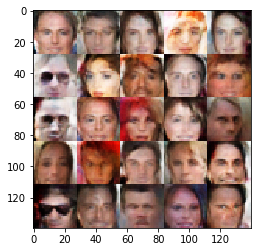

Epoch 2/5... Discriminator Loss: 1.2848... Generator Loss: 0.5785
Epoch 2/5... Discriminator Loss: 1.3214... Generator Loss: 0.6406
Epoch 2/5... Discriminator Loss: 1.3702... Generator Loss: 0.4779
Epoch 2/5... Discriminator Loss: 1.3751... Generator Loss: 0.6843
Epoch 2/5... Discriminator Loss: 1.5754... Generator Loss: 0.3729
Epoch 2/5... Discriminator Loss: 1.4336... Generator Loss: 0.4380
Epoch 2/5... Discriminator Loss: 1.1419... Generator Loss: 0.6224
Epoch 2/5... Discriminator Loss: 1.6478... Generator Loss: 0.2747
Epoch 2/5... Discriminator Loss: 1.4470... Generator Loss: 0.4214
Epoch 2/5... Discriminator Loss: 1.3292... Generator Loss: 0.5728


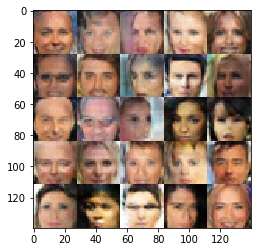

Epoch 2/5... Discriminator Loss: 1.2954... Generator Loss: 0.5376
Epoch 2/5... Discriminator Loss: 1.3789... Generator Loss: 0.4842
Epoch 2/5... Discriminator Loss: 1.3574... Generator Loss: 0.4379
Epoch 2/5... Discriminator Loss: 1.2539... Generator Loss: 0.5564
Epoch 2/5... Discriminator Loss: 1.2828... Generator Loss: 0.6233
Epoch 2/5... Discriminator Loss: 1.1979... Generator Loss: 0.7090
Epoch 2/5... Discriminator Loss: 1.3253... Generator Loss: 0.5513
Epoch 2/5... Discriminator Loss: 1.1381... Generator Loss: 0.9173
Epoch 2/5... Discriminator Loss: 1.3560... Generator Loss: 0.7961
Epoch 2/5... Discriminator Loss: 1.2929... Generator Loss: 0.7924


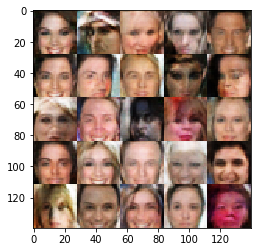

Epoch 2/5... Discriminator Loss: 1.4192... Generator Loss: 0.3945
Epoch 2/5... Discriminator Loss: 1.1645... Generator Loss: 0.9656
Epoch 2/5... Discriminator Loss: 1.3783... Generator Loss: 0.4406
Epoch 2/5... Discriminator Loss: 1.3612... Generator Loss: 0.5978
Epoch 2/5... Discriminator Loss: 1.1708... Generator Loss: 0.7376
Epoch 2/5... Discriminator Loss: 1.2471... Generator Loss: 0.7251
Epoch 2/5... Discriminator Loss: 1.4113... Generator Loss: 0.5277
Epoch 2/5... Discriminator Loss: 1.4280... Generator Loss: 0.3587
Epoch 2/5... Discriminator Loss: 1.2739... Generator Loss: 0.5958
Epoch 2/5... Discriminator Loss: 1.2798... Generator Loss: 0.9098


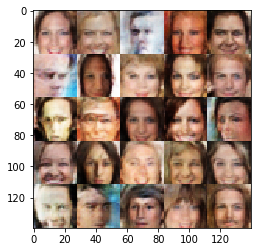

Epoch 2/5... Discriminator Loss: 1.2885... Generator Loss: 0.5816
Epoch 2/5... Discriminator Loss: 1.3699... Generator Loss: 0.5064
Epoch 2/5... Discriminator Loss: 1.3567... Generator Loss: 0.5677
Epoch 2/5... Discriminator Loss: 1.3125... Generator Loss: 1.0380
Epoch 2/5... Discriminator Loss: 1.2855... Generator Loss: 0.7065
Epoch 2/5... Discriminator Loss: 1.2381... Generator Loss: 0.5862
Epoch 2/5... Discriminator Loss: 1.2411... Generator Loss: 0.5500
Epoch 2/5... Discriminator Loss: 1.1837... Generator Loss: 0.6241
Epoch 2/5... Discriminator Loss: 1.4967... Generator Loss: 0.7952
Epoch 2/5... Discriminator Loss: 1.2988... Generator Loss: 0.4584


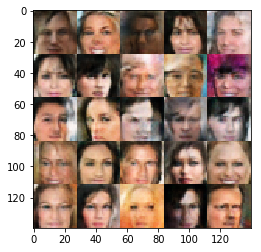

Epoch 2/5... Discriminator Loss: 1.4536... Generator Loss: 0.5152
Epoch 2/5... Discriminator Loss: 1.2231... Generator Loss: 0.8490
Epoch 2/5... Discriminator Loss: 1.2749... Generator Loss: 0.6750
Epoch 2/5... Discriminator Loss: 1.3042... Generator Loss: 0.5195
Epoch 2/5... Discriminator Loss: 1.2572... Generator Loss: 0.5613
Epoch 2/5... Discriminator Loss: 1.1426... Generator Loss: 0.7762
Epoch 2/5... Discriminator Loss: 1.2996... Generator Loss: 0.5407
Epoch 2/5... Discriminator Loss: 1.2321... Generator Loss: 0.6307
Epoch 2/5... Discriminator Loss: 1.4347... Generator Loss: 0.3607
Epoch 2/5... Discriminator Loss: 1.3115... Generator Loss: 1.0124


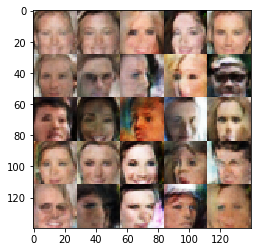

Epoch 2/5... Discriminator Loss: 1.2851... Generator Loss: 0.4801
Epoch 2/5... Discriminator Loss: 1.2536... Generator Loss: 0.8737
Epoch 2/5... Discriminator Loss: 1.3170... Generator Loss: 0.4338
Epoch 2/5... Discriminator Loss: 1.3408... Generator Loss: 0.4957
Epoch 2/5... Discriminator Loss: 1.3217... Generator Loss: 0.5992
Epoch 2/5... Discriminator Loss: 1.3345... Generator Loss: 0.4964
Epoch 2/5... Discriminator Loss: 1.5460... Generator Loss: 0.3218
Epoch 2/5... Discriminator Loss: 1.1763... Generator Loss: 0.8608
Epoch 2/5... Discriminator Loss: 1.2560... Generator Loss: 0.6229
Epoch 2/5... Discriminator Loss: 1.1527... Generator Loss: 0.5532


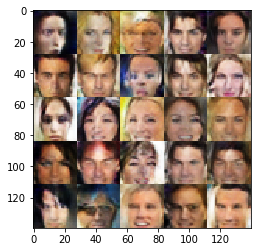

Epoch 2/5... Discriminator Loss: 1.3597... Generator Loss: 0.4637
Epoch 2/5... Discriminator Loss: 1.2424... Generator Loss: 0.5957
Epoch 2/5... Discriminator Loss: 1.4396... Generator Loss: 0.3795
Epoch 2/5... Discriminator Loss: 1.2811... Generator Loss: 0.4368
Epoch 2/5... Discriminator Loss: 1.3126... Generator Loss: 0.5405
Epoch 2/5... Discriminator Loss: 1.3158... Generator Loss: 0.5920
Epoch 2/5... Discriminator Loss: 1.1719... Generator Loss: 0.6338
Epoch 2/5... Discriminator Loss: 1.2728... Generator Loss: 0.6214
Epoch 2/5... Discriminator Loss: 1.3489... Generator Loss: 0.5039
Epoch 2/5... Discriminator Loss: 1.1667... Generator Loss: 0.9558


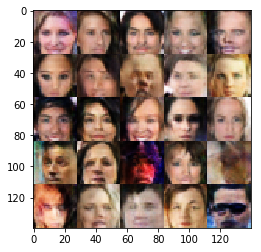

Epoch 2/5... Discriminator Loss: 1.3315... Generator Loss: 0.4669
Epoch 2/5... Discriminator Loss: 1.5245... Generator Loss: 0.3488
Epoch 2/5... Discriminator Loss: 1.2313... Generator Loss: 0.5967
Epoch 2/5... Discriminator Loss: 1.1559... Generator Loss: 0.8361
Epoch 2/5... Discriminator Loss: 1.0874... Generator Loss: 0.6239
Epoch 2/5... Discriminator Loss: 1.1612... Generator Loss: 0.6996
Epoch 2/5... Discriminator Loss: 1.4532... Generator Loss: 0.4166
Epoch 2/5... Discriminator Loss: 1.2103... Generator Loss: 0.6249
Epoch 2/5... Discriminator Loss: 1.2486... Generator Loss: 0.7317
Epoch 2/5... Discriminator Loss: 1.2503... Generator Loss: 0.6042


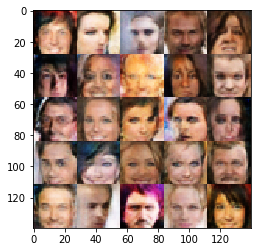

Epoch 2/5... Discriminator Loss: 1.5166... Generator Loss: 0.3584
Epoch 2/5... Discriminator Loss: 1.3652... Generator Loss: 0.6562
Epoch 2/5... Discriminator Loss: 1.2884... Generator Loss: 0.7444
Epoch 2/5... Discriminator Loss: 1.3986... Generator Loss: 0.9958
Epoch 2/5... Discriminator Loss: 1.3870... Generator Loss: 0.7740
Epoch 2/5... Discriminator Loss: 1.0921... Generator Loss: 1.0133
Epoch 2/5... Discriminator Loss: 1.2897... Generator Loss: 0.5041
Epoch 2/5... Discriminator Loss: 1.2764... Generator Loss: 0.5013
Epoch 2/5... Discriminator Loss: 1.1800... Generator Loss: 0.5840
Epoch 2/5... Discriminator Loss: 1.2841... Generator Loss: 0.7336


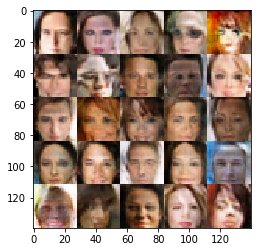

Epoch 2/5... Discriminator Loss: 1.2434... Generator Loss: 1.3188
Epoch 2/5... Discriminator Loss: 1.4871... Generator Loss: 0.4564
Epoch 2/5... Discriminator Loss: 1.2108... Generator Loss: 0.6577
Epoch 2/5... Discriminator Loss: 1.2066... Generator Loss: 0.6684
Epoch 2/5... Discriminator Loss: 1.2390... Generator Loss: 0.6420
Epoch 2/5... Discriminator Loss: 1.2309... Generator Loss: 0.8088
Epoch 2/5... Discriminator Loss: 1.2121... Generator Loss: 0.7471
Epoch 2/5... Discriminator Loss: 1.1060... Generator Loss: 0.8127
Epoch 2/5... Discriminator Loss: 1.6293... Generator Loss: 0.3204
Epoch 2/5... Discriminator Loss: 1.3340... Generator Loss: 0.6241


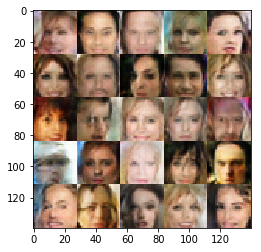

Epoch 2/5... Discriminator Loss: 1.2688... Generator Loss: 0.5461
Epoch 2/5... Discriminator Loss: 1.1142... Generator Loss: 0.7211
Epoch 2/5... Discriminator Loss: 1.1454... Generator Loss: 0.6232
Epoch 2/5... Discriminator Loss: 1.2572... Generator Loss: 0.5432
Epoch 2/5... Discriminator Loss: 1.4585... Generator Loss: 0.4163
Epoch 2/5... Discriminator Loss: 1.3037... Generator Loss: 0.5680
Epoch 2/5... Discriminator Loss: 1.3663... Generator Loss: 0.4205
Epoch 2/5... Discriminator Loss: 1.3127... Generator Loss: 0.7084
Epoch 2/5... Discriminator Loss: 1.2970... Generator Loss: 0.4811
Epoch 2/5... Discriminator Loss: 1.2253... Generator Loss: 0.6830


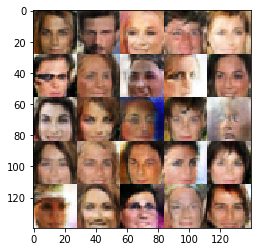

Epoch 2/5... Discriminator Loss: 1.5223... Generator Loss: 0.8670
Epoch 2/5... Discriminator Loss: 1.6084... Generator Loss: 0.3029
Epoch 2/5... Discriminator Loss: 1.3730... Generator Loss: 0.5975
Epoch 2/5... Discriminator Loss: 1.1684... Generator Loss: 0.7880
Epoch 2/5... Discriminator Loss: 1.3251... Generator Loss: 0.7311
Epoch 2/5... Discriminator Loss: 1.2036... Generator Loss: 0.8089
Epoch 2/5... Discriminator Loss: 1.3921... Generator Loss: 0.8515
Epoch 2/5... Discriminator Loss: 1.5947... Generator Loss: 0.3142
Epoch 2/5... Discriminator Loss: 1.3244... Generator Loss: 0.4543
Epoch 2/5... Discriminator Loss: 1.1894... Generator Loss: 0.8501


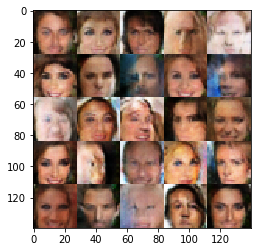

Epoch 2/5... Discriminator Loss: 1.1892... Generator Loss: 0.7709
Epoch 2/5... Discriminator Loss: 1.5169... Generator Loss: 0.4481
Epoch 2/5... Discriminator Loss: 1.2031... Generator Loss: 0.7850
Epoch 2/5... Discriminator Loss: 1.2912... Generator Loss: 0.5179
Epoch 2/5... Discriminator Loss: 1.1925... Generator Loss: 0.6324
Epoch 2/5... Discriminator Loss: 1.2555... Generator Loss: 0.5328
Epoch 2/5... Discriminator Loss: 1.3021... Generator Loss: 0.5808
Epoch 2/5... Discriminator Loss: 1.2823... Generator Loss: 0.4590
Epoch 2/5... Discriminator Loss: 1.3321... Generator Loss: 0.6560
Epoch 2/5... Discriminator Loss: 1.3124... Generator Loss: 0.5071


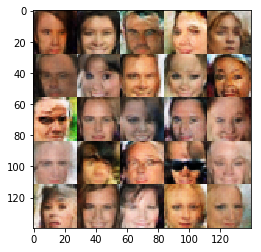

Epoch 2/5... Discriminator Loss: 1.1592... Generator Loss: 0.5807
Epoch 2/5... Discriminator Loss: 1.1507... Generator Loss: 0.5621
Epoch 2/5... Discriminator Loss: 1.2230... Generator Loss: 0.6385
Epoch 2/5... Discriminator Loss: 1.0640... Generator Loss: 0.8774
Epoch 2/5... Discriminator Loss: 1.1807... Generator Loss: 0.6933
Epoch 2/5... Discriminator Loss: 1.2345... Generator Loss: 1.0470
Epoch 2/5... Discriminator Loss: 1.4098... Generator Loss: 0.3917
Epoch 2/5... Discriminator Loss: 1.0481... Generator Loss: 0.9066
Epoch 2/5... Discriminator Loss: 1.0386... Generator Loss: 0.7069
Epoch 2/5... Discriminator Loss: 1.1353... Generator Loss: 0.6001


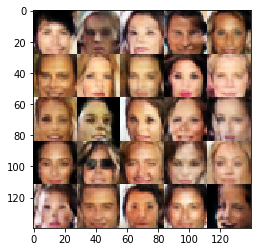

Epoch 2/5... Discriminator Loss: 1.7174... Generator Loss: 0.2710
Epoch 2/5... Discriminator Loss: 1.2546... Generator Loss: 0.9813
Epoch 2/5... Discriminator Loss: 1.3044... Generator Loss: 0.4771
Epoch 2/5... Discriminator Loss: 1.1569... Generator Loss: 0.7154
Epoch 2/5... Discriminator Loss: 1.4983... Generator Loss: 0.3375
Epoch 2/5... Discriminator Loss: 1.1685... Generator Loss: 0.9350
Epoch 2/5... Discriminator Loss: 1.2109... Generator Loss: 0.7972
Epoch 2/5... Discriminator Loss: 1.5970... Generator Loss: 0.3147
Epoch 2/5... Discriminator Loss: 1.2620... Generator Loss: 0.6378
Epoch 2/5... Discriminator Loss: 1.4199... Generator Loss: 0.4144


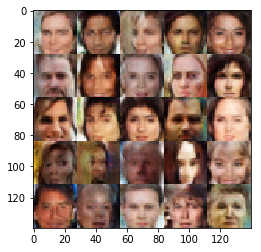

Epoch 2/5... Discriminator Loss: 1.3936... Generator Loss: 0.4272
Epoch 2/5... Discriminator Loss: 1.0666... Generator Loss: 0.7474
Epoch 2/5... Discriminator Loss: 1.3652... Generator Loss: 0.5775
Epoch 2/5... Discriminator Loss: 1.2418... Generator Loss: 0.5240
Epoch 2/5... Discriminator Loss: 1.3050... Generator Loss: 0.6781
Epoch 2/5... Discriminator Loss: 1.3523... Generator Loss: 0.5145
Epoch 2/5... Discriminator Loss: 1.1157... Generator Loss: 0.9720
Epoch 2/5... Discriminator Loss: 1.4615... Generator Loss: 0.5792
Epoch 2/5... Discriminator Loss: 1.2146... Generator Loss: 0.6653
Epoch 2/5... Discriminator Loss: 1.1495... Generator Loss: 0.6896


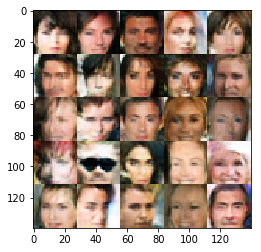

Epoch 2/5... Discriminator Loss: 1.1514... Generator Loss: 0.7235
Epoch 2/5... Discriminator Loss: 1.1152... Generator Loss: 0.6258
Epoch 2/5... Discriminator Loss: 1.3618... Generator Loss: 1.1051
Epoch 2/5... Discriminator Loss: 1.1210... Generator Loss: 0.7356
Epoch 2/5... Discriminator Loss: 1.1950... Generator Loss: 0.6918
Epoch 2/5... Discriminator Loss: 1.3106... Generator Loss: 0.5961
Epoch 2/5... Discriminator Loss: 1.1111... Generator Loss: 0.9676
Epoch 2/5... Discriminator Loss: 1.4914... Generator Loss: 0.4413
Epoch 2/5... Discriminator Loss: 1.1900... Generator Loss: 0.6544
Epoch 2/5... Discriminator Loss: 1.3439... Generator Loss: 0.4640


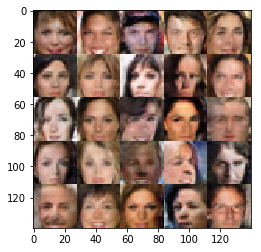

Epoch 2/5... Discriminator Loss: 1.2372... Generator Loss: 0.5678
Epoch 2/5... Discriminator Loss: 1.2517... Generator Loss: 0.5804
Epoch 2/5... Discriminator Loss: 1.2169... Generator Loss: 0.6625
Epoch 2/5... Discriminator Loss: 1.2606... Generator Loss: 0.5090
Epoch 2/5... Discriminator Loss: 1.0708... Generator Loss: 0.8360
Epoch 2/5... Discriminator Loss: 1.5155... Generator Loss: 0.3506
Epoch 2/5... Discriminator Loss: 1.1894... Generator Loss: 0.6657
Epoch 2/5... Discriminator Loss: 1.1614... Generator Loss: 0.7704
Epoch 2/5... Discriminator Loss: 1.1361... Generator Loss: 0.6485
Epoch 2/5... Discriminator Loss: 1.2594... Generator Loss: 0.6824


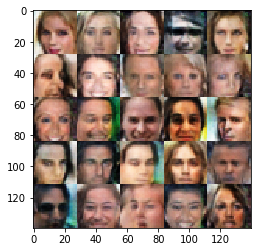

Epoch 2/5... Discriminator Loss: 1.2800... Generator Loss: 0.6257
Epoch 2/5... Discriminator Loss: 1.1831... Generator Loss: 0.5232
Epoch 2/5... Discriminator Loss: 1.4087... Generator Loss: 0.5407
Epoch 2/5... Discriminator Loss: 1.3633... Generator Loss: 0.6421
Epoch 2/5... Discriminator Loss: 1.0428... Generator Loss: 0.8379
Epoch 2/5... Discriminator Loss: 1.4112... Generator Loss: 0.4158
Epoch 2/5... Discriminator Loss: 1.4914... Generator Loss: 0.3432
Epoch 2/5... Discriminator Loss: 1.2107... Generator Loss: 0.5440
Epoch 2/5... Discriminator Loss: 1.1690... Generator Loss: 0.7175
Epoch 2/5... Discriminator Loss: 1.2097... Generator Loss: 0.6702


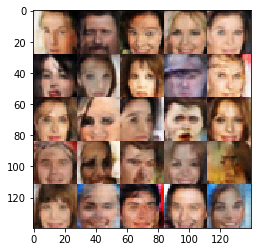

Epoch 2/5... Discriminator Loss: 1.2585... Generator Loss: 0.5193
Epoch 2/5... Discriminator Loss: 1.3136... Generator Loss: 0.6122
Epoch 2/5... Discriminator Loss: 1.4246... Generator Loss: 0.3800
Epoch 2/5... Discriminator Loss: 1.4612... Generator Loss: 0.4314
Epoch 2/5... Discriminator Loss: 1.1908... Generator Loss: 0.9936
Epoch 2/5... Discriminator Loss: 1.2189... Generator Loss: 0.6973
Epoch 2/5... Discriminator Loss: 1.2970... Generator Loss: 0.5447
Epoch 2/5... Discriminator Loss: 1.1030... Generator Loss: 0.6411
Epoch 2/5... Discriminator Loss: 1.4024... Generator Loss: 0.3813
Epoch 2/5... Discriminator Loss: 1.3719... Generator Loss: 0.6382


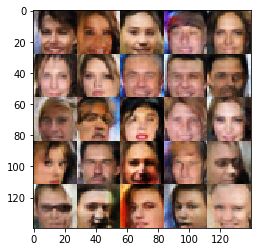

Epoch 2/5... Discriminator Loss: 1.3206... Generator Loss: 0.4371
Epoch 2/5... Discriminator Loss: 1.3217... Generator Loss: 0.4241
Epoch 2/5... Discriminator Loss: 1.1269... Generator Loss: 0.6139
Epoch 2/5... Discriminator Loss: 1.1744... Generator Loss: 0.7264
Epoch 2/5... Discriminator Loss: 1.2765... Generator Loss: 0.5593
Epoch 2/5... Discriminator Loss: 1.2571... Generator Loss: 0.6206
Epoch 2/5... Discriminator Loss: 1.2299... Generator Loss: 0.4983
Epoch 2/5... Discriminator Loss: 1.2594... Generator Loss: 0.5506
Epoch 2/5... Discriminator Loss: 1.2474... Generator Loss: 0.6606
Epoch 2/5... Discriminator Loss: 1.3353... Generator Loss: 0.4728


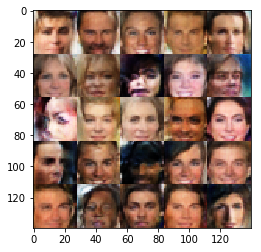

Epoch 2/5... Discriminator Loss: 0.8529... Generator Loss: 0.9205
Epoch 2/5... Discriminator Loss: 1.1624... Generator Loss: 0.8723
Epoch 2/5... Discriminator Loss: 1.3527... Generator Loss: 0.5311
Epoch 2/5... Discriminator Loss: 1.2971... Generator Loss: 1.0168
Epoch 2/5... Discriminator Loss: 1.2638... Generator Loss: 0.5715
Epoch 2/5... Discriminator Loss: 1.1868... Generator Loss: 0.7430
Epoch 2/5... Discriminator Loss: 1.5036... Generator Loss: 0.4264
Epoch 2/5... Discriminator Loss: 1.1948... Generator Loss: 0.6771
Epoch 2/5... Discriminator Loss: 1.2496... Generator Loss: 1.1231
Epoch 2/5... Discriminator Loss: 1.3145... Generator Loss: 0.5119


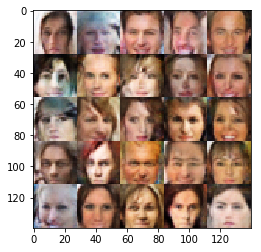

Epoch 2/5... Discriminator Loss: 1.4121... Generator Loss: 0.3886
Epoch 2/5... Discriminator Loss: 1.4018... Generator Loss: 0.7349
Epoch 2/5... Discriminator Loss: 1.0163... Generator Loss: 0.6785
Epoch 2/5... Discriminator Loss: 1.2695... Generator Loss: 0.5745
Epoch 2/5... Discriminator Loss: 1.1932... Generator Loss: 0.6352
Epoch 2/5... Discriminator Loss: 1.2520... Generator Loss: 0.7332
Epoch 2/5... Discriminator Loss: 1.5573... Generator Loss: 0.3176
Epoch 2/5... Discriminator Loss: 1.2763... Generator Loss: 0.6410
Epoch 2/5... Discriminator Loss: 1.1065... Generator Loss: 0.8631
Epoch 2/5... Discriminator Loss: 1.0520... Generator Loss: 0.9953


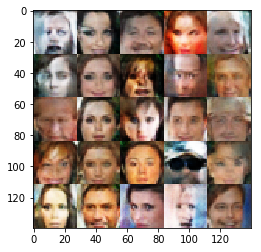

Epoch 2/5... Discriminator Loss: 1.2057... Generator Loss: 1.0038
Epoch 2/5... Discriminator Loss: 1.2461... Generator Loss: 0.9220
Epoch 2/5... Discriminator Loss: 1.2952... Generator Loss: 0.5244
Epoch 2/5... Discriminator Loss: 1.1781... Generator Loss: 0.5970
Epoch 2/5... Discriminator Loss: 1.2843... Generator Loss: 0.5005
Epoch 2/5... Discriminator Loss: 1.2692... Generator Loss: 0.6003
Epoch 2/5... Discriminator Loss: 1.3798... Generator Loss: 0.3985
Epoch 2/5... Discriminator Loss: 1.1906... Generator Loss: 0.7403
Epoch 2/5... Discriminator Loss: 1.1684... Generator Loss: 0.5670
Epoch 2/5... Discriminator Loss: 1.2346... Generator Loss: 0.5485


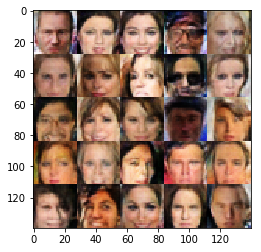

Epoch 2/5... Discriminator Loss: 1.1065... Generator Loss: 0.8438
Epoch 2/5... Discriminator Loss: 1.3211... Generator Loss: 0.6588
Epoch 2/5... Discriminator Loss: 1.2778... Generator Loss: 0.6180
Epoch 2/5... Discriminator Loss: 1.0054... Generator Loss: 1.0415
Epoch 2/5... Discriminator Loss: 1.4898... Generator Loss: 0.3726
Epoch 2/5... Discriminator Loss: 1.3492... Generator Loss: 0.5633
Epoch 2/5... Discriminator Loss: 1.6440... Generator Loss: 1.3443
Epoch 2/5... Discriminator Loss: 1.1240... Generator Loss: 0.7661
Epoch 2/5... Discriminator Loss: 1.2872... Generator Loss: 0.7444
Epoch 2/5... Discriminator Loss: 1.1974... Generator Loss: 0.8313


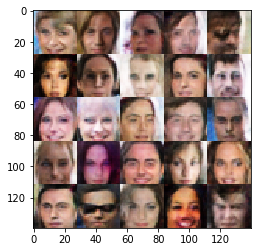

Epoch 2/5... Discriminator Loss: 1.4468... Generator Loss: 0.3893
Epoch 2/5... Discriminator Loss: 1.2107... Generator Loss: 0.6498
Epoch 2/5... Discriminator Loss: 1.1902... Generator Loss: 0.6444
Epoch 2/5... Discriminator Loss: 1.6006... Generator Loss: 0.2919
Epoch 2/5... Discriminator Loss: 1.2102... Generator Loss: 0.7628
Epoch 2/5... Discriminator Loss: 1.2833... Generator Loss: 0.4979
Epoch 2/5... Discriminator Loss: 1.3138... Generator Loss: 0.4794
Epoch 2/5... Discriminator Loss: 1.0327... Generator Loss: 0.6774
Epoch 2/5... Discriminator Loss: 1.0294... Generator Loss: 0.7095
Epoch 2/5... Discriminator Loss: 1.3822... Generator Loss: 0.4118


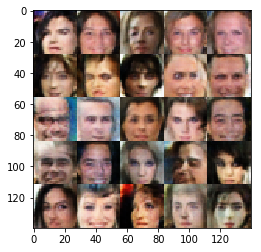

Epoch 2/5... Discriminator Loss: 1.2476... Generator Loss: 0.5135
Epoch 2/5... Discriminator Loss: 1.2474... Generator Loss: 0.8259
Epoch 2/5... Discriminator Loss: 1.3047... Generator Loss: 0.5536
Epoch 2/5... Discriminator Loss: 1.3741... Generator Loss: 0.4408
Epoch 2/5... Discriminator Loss: 1.2721... Generator Loss: 0.4683
Epoch 2/5... Discriminator Loss: 1.1614... Generator Loss: 0.6148
Epoch 2/5... Discriminator Loss: 1.3422... Generator Loss: 0.4209
Epoch 2/5... Discriminator Loss: 1.3104... Generator Loss: 0.8869
Epoch 2/5... Discriminator Loss: 1.2681... Generator Loss: 0.4890
Epoch 2/5... Discriminator Loss: 1.2436... Generator Loss: 0.6545


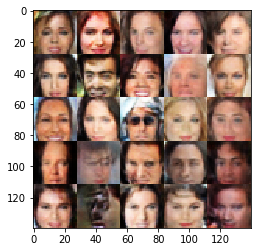

Epoch 2/5... Discriminator Loss: 1.3372... Generator Loss: 0.4815
Epoch 2/5... Discriminator Loss: 1.3590... Generator Loss: 0.6960
Epoch 2/5... Discriminator Loss: 1.2700... Generator Loss: 0.5457
Epoch 2/5... Discriminator Loss: 1.1918... Generator Loss: 0.6957
Epoch 2/5... Discriminator Loss: 1.2142... Generator Loss: 0.5391
Epoch 2/5... Discriminator Loss: 1.2922... Generator Loss: 0.5748
Epoch 2/5... Discriminator Loss: 1.1314... Generator Loss: 0.7418
Epoch 2/5... Discriminator Loss: 1.2713... Generator Loss: 0.5740
Epoch 2/5... Discriminator Loss: 1.2257... Generator Loss: 0.7271
Epoch 2/5... Discriminator Loss: 1.3150... Generator Loss: 0.4645


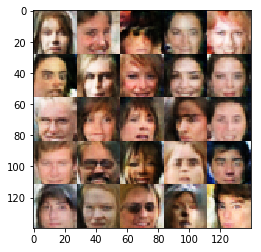

Epoch 2/5... Discriminator Loss: 1.4080... Generator Loss: 0.9037
Epoch 2/5... Discriminator Loss: 1.2418... Generator Loss: 0.9699
Epoch 2/5... Discriminator Loss: 1.2893... Generator Loss: 0.5543
Epoch 2/5... Discriminator Loss: 1.2973... Generator Loss: 0.5299
Epoch 2/5... Discriminator Loss: 1.1157... Generator Loss: 0.6356
Epoch 2/5... Discriminator Loss: 1.1385... Generator Loss: 0.6097
Epoch 2/5... Discriminator Loss: 1.2768... Generator Loss: 0.7652
Epoch 2/5... Discriminator Loss: 1.2027... Generator Loss: 0.5379
Epoch 2/5... Discriminator Loss: 1.2513... Generator Loss: 0.7971
Epoch 2/5... Discriminator Loss: 1.2967... Generator Loss: 0.5392


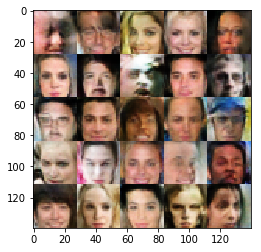

Epoch 2/5... Discriminator Loss: 1.6466... Generator Loss: 0.2822
Epoch 2/5... Discriminator Loss: 1.1817... Generator Loss: 1.2463
Epoch 2/5... Discriminator Loss: 1.1650... Generator Loss: 0.6145
Epoch 2/5... Discriminator Loss: 1.2305... Generator Loss: 0.7219
Epoch 2/5... Discriminator Loss: 1.2379... Generator Loss: 0.9457
Epoch 2/5... Discriminator Loss: 1.1502... Generator Loss: 0.7356
Epoch 2/5... Discriminator Loss: 1.1820... Generator Loss: 0.7532
Epoch 2/5... Discriminator Loss: 1.1430... Generator Loss: 0.6159
Epoch 2/5... Discriminator Loss: 1.3958... Generator Loss: 0.3966
Epoch 2/5... Discriminator Loss: 1.0989... Generator Loss: 0.6754


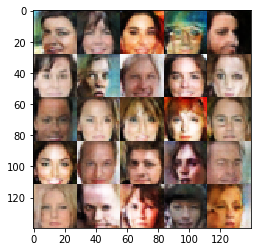

Epoch 2/5... Discriminator Loss: 1.2462... Generator Loss: 0.8077
Epoch 2/5... Discriminator Loss: 1.2548... Generator Loss: 0.5339
Epoch 2/5... Discriminator Loss: 1.0285... Generator Loss: 0.8276
Epoch 2/5... Discriminator Loss: 1.3180... Generator Loss: 0.9052
Epoch 2/5... Discriminator Loss: 1.1468... Generator Loss: 0.7090
Epoch 2/5... Discriminator Loss: 1.1869... Generator Loss: 0.8232
Epoch 2/5... Discriminator Loss: 1.0966... Generator Loss: 0.8116
Epoch 2/5... Discriminator Loss: 1.4501... Generator Loss: 1.0288
Epoch 2/5... Discriminator Loss: 1.1106... Generator Loss: 0.8164
Epoch 2/5... Discriminator Loss: 1.0238... Generator Loss: 0.9447


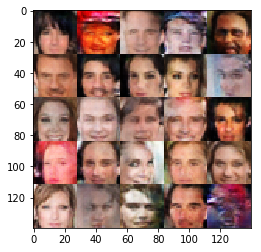

Epoch 2/5... Discriminator Loss: 1.2268... Generator Loss: 0.5384
Epoch 2/5... Discriminator Loss: 1.3723... Generator Loss: 0.3995
Epoch 2/5... Discriminator Loss: 1.2822... Generator Loss: 0.8201
Epoch 2/5... Discriminator Loss: 1.1161... Generator Loss: 0.6246
Epoch 2/5... Discriminator Loss: 1.5524... Generator Loss: 0.3544
Epoch 2/5... Discriminator Loss: 1.1650... Generator Loss: 0.6246
Epoch 2/5... Discriminator Loss: 1.3328... Generator Loss: 0.5545
Epoch 2/5... Discriminator Loss: 1.2091... Generator Loss: 0.6027
Epoch 2/5... Discriminator Loss: 1.1801... Generator Loss: 0.5823
Epoch 2/5... Discriminator Loss: 1.4461... Generator Loss: 0.3441


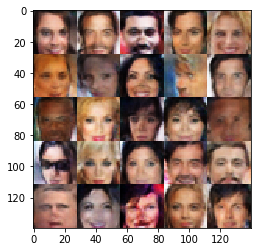

Epoch 2/5... Discriminator Loss: 1.2435... Generator Loss: 0.5103
Epoch 2/5... Discriminator Loss: 1.2415... Generator Loss: 0.8774
Epoch 2/5... Discriminator Loss: 1.3517... Generator Loss: 0.4923
Epoch 2/5... Discriminator Loss: 1.1079... Generator Loss: 0.6312
Epoch 2/5... Discriminator Loss: 1.6314... Generator Loss: 0.3928
Epoch 2/5... Discriminator Loss: 1.0129... Generator Loss: 0.7588
Epoch 2/5... Discriminator Loss: 1.2176... Generator Loss: 1.0825
Epoch 2/5... Discriminator Loss: 1.1008... Generator Loss: 0.7640
Epoch 2/5... Discriminator Loss: 1.6348... Generator Loss: 1.4281
Epoch 2/5... Discriminator Loss: 1.5695... Generator Loss: 0.3392


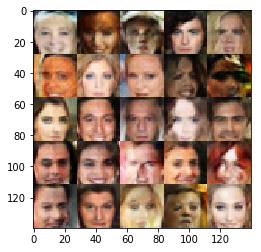

Epoch 2/5... Discriminator Loss: 1.2251... Generator Loss: 0.4538
Epoch 2/5... Discriminator Loss: 1.1157... Generator Loss: 0.5762
Epoch 2/5... Discriminator Loss: 1.1725... Generator Loss: 0.7740
Epoch 2/5... Discriminator Loss: 1.0758... Generator Loss: 0.8971
Epoch 2/5... Discriminator Loss: 1.1533... Generator Loss: 0.5735
Epoch 2/5... Discriminator Loss: 1.1405... Generator Loss: 0.6857
Epoch 2/5... Discriminator Loss: 1.0392... Generator Loss: 1.0221
Epoch 2/5... Discriminator Loss: 1.2479... Generator Loss: 0.9616
Epoch 2/5... Discriminator Loss: 1.3100... Generator Loss: 0.9241
Epoch 2/5... Discriminator Loss: 1.0423... Generator Loss: 0.9088


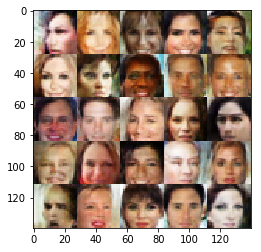

Epoch 2/5... Discriminator Loss: 1.1891... Generator Loss: 0.7766
Epoch 2/5... Discriminator Loss: 0.9517... Generator Loss: 0.9732
Epoch 2/5... Discriminator Loss: 1.0857... Generator Loss: 1.2137
Epoch 2/5... Discriminator Loss: 1.2939... Generator Loss: 0.5419
Epoch 2/5... Discriminator Loss: 1.1231... Generator Loss: 0.6806
Epoch 2/5... Discriminator Loss: 1.2570... Generator Loss: 0.5400
Epoch 2/5... Discriminator Loss: 1.5133... Generator Loss: 0.3284
Epoch 2/5... Discriminator Loss: 1.2055... Generator Loss: 0.5540
Epoch 2/5... Discriminator Loss: 1.0693... Generator Loss: 0.9749
Epoch 2/5... Discriminator Loss: 1.1691... Generator Loss: 0.6330


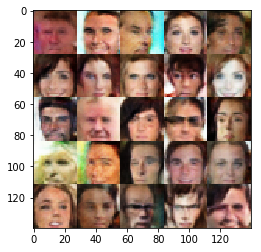

Epoch 2/5... Discriminator Loss: 1.3117... Generator Loss: 0.5047
Epoch 2/5... Discriminator Loss: 1.1181... Generator Loss: 0.6203
Epoch 2/5... Discriminator Loss: 1.2946... Generator Loss: 0.7225
Epoch 2/5... Discriminator Loss: 1.3424... Generator Loss: 0.4207
Epoch 2/5... Discriminator Loss: 1.2883... Generator Loss: 0.8896
Epoch 2/5... Discriminator Loss: 1.1945... Generator Loss: 0.5103
Epoch 2/5... Discriminator Loss: 1.1832... Generator Loss: 0.6800
Epoch 2/5... Discriminator Loss: 1.1948... Generator Loss: 0.6470
Epoch 2/5... Discriminator Loss: 1.1649... Generator Loss: 0.7857
Epoch 2/5... Discriminator Loss: 1.1758... Generator Loss: 0.9374


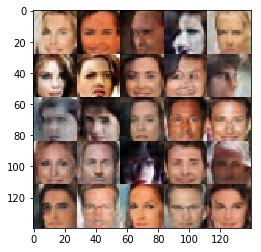

Epoch 2/5... Discriminator Loss: 1.1890... Generator Loss: 0.7259
Epoch 2/5... Discriminator Loss: 1.1823... Generator Loss: 0.5475
Epoch 2/5... Discriminator Loss: 1.2365... Generator Loss: 0.8093
Epoch 2/5... Discriminator Loss: 1.1713... Generator Loss: 0.9039
Epoch 2/5... Discriminator Loss: 1.2608... Generator Loss: 0.6234
Epoch 2/5... Discriminator Loss: 1.2112... Generator Loss: 0.5548
Epoch 2/5... Discriminator Loss: 1.2391... Generator Loss: 0.6620
Epoch 2/5... Discriminator Loss: 1.4948... Generator Loss: 0.3725
Epoch 2/5... Discriminator Loss: 1.2780... Generator Loss: 0.4656
Epoch 2/5... Discriminator Loss: 1.4736... Generator Loss: 0.3733


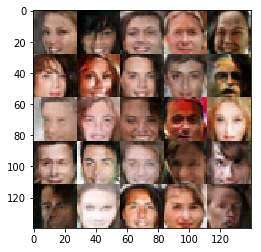

Epoch 2/5... Discriminator Loss: 1.5042... Generator Loss: 0.4788
Epoch 2/5... Discriminator Loss: 1.2701... Generator Loss: 0.9419
Epoch 2/5... Discriminator Loss: 1.0632... Generator Loss: 0.6875
Epoch 2/5... Discriminator Loss: 1.2126... Generator Loss: 0.6636
Epoch 2/5... Discriminator Loss: 1.2464... Generator Loss: 0.5222
Epoch 2/5... Discriminator Loss: 1.0038... Generator Loss: 0.8493
Epoch 2/5... Discriminator Loss: 1.1940... Generator Loss: 0.7065
Epoch 2/5... Discriminator Loss: 1.2798... Generator Loss: 0.5270
Epoch 2/5... Discriminator Loss: 1.2901... Generator Loss: 0.4679
Epoch 2/5... Discriminator Loss: 1.3686... Generator Loss: 0.5361


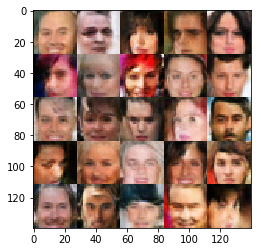

Epoch 2/5... Discriminator Loss: 1.1991... Generator Loss: 0.6083
Epoch 2/5... Discriminator Loss: 0.9871... Generator Loss: 0.8115
Epoch 2/5... Discriminator Loss: 1.3204... Generator Loss: 0.6485
Epoch 2/5... Discriminator Loss: 1.3005... Generator Loss: 0.4472
Epoch 2/5... Discriminator Loss: 1.1829... Generator Loss: 0.5470
Epoch 2/5... Discriminator Loss: 1.2034... Generator Loss: 0.6603
Epoch 2/5... Discriminator Loss: 1.1762... Generator Loss: 0.5405
Epoch 2/5... Discriminator Loss: 0.9588... Generator Loss: 0.9469
Epoch 2/5... Discriminator Loss: 1.3203... Generator Loss: 1.0383
Epoch 2/5... Discriminator Loss: 1.2751... Generator Loss: 0.4475


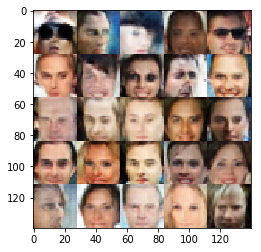

Epoch 2/5... Discriminator Loss: 1.2803... Generator Loss: 0.6645
Epoch 2/5... Discriminator Loss: 1.3007... Generator Loss: 0.5077
Epoch 2/5... Discriminator Loss: 1.2432... Generator Loss: 0.9209
Epoch 2/5... Discriminator Loss: 1.1395... Generator Loss: 0.6675
Epoch 2/5... Discriminator Loss: 1.1206... Generator Loss: 0.6386
Epoch 2/5... Discriminator Loss: 1.1718... Generator Loss: 0.9343
Epoch 2/5... Discriminator Loss: 1.4234... Generator Loss: 0.4269
Epoch 2/5... Discriminator Loss: 1.3772... Generator Loss: 0.4617
Epoch 2/5... Discriminator Loss: 1.3706... Generator Loss: 0.4441
Epoch 2/5... Discriminator Loss: 1.0787... Generator Loss: 0.8959


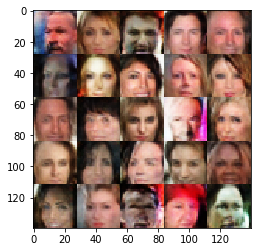

Epoch 2/5... Discriminator Loss: 1.3355... Generator Loss: 0.5126
Epoch 2/5... Discriminator Loss: 1.4408... Generator Loss: 0.4271
Epoch 2/5... Discriminator Loss: 1.3512... Generator Loss: 1.0647
Epoch 2/5... Discriminator Loss: 1.4197... Generator Loss: 0.4252
Epoch 2/5... Discriminator Loss: 1.2582... Generator Loss: 0.4442
Epoch 2/5... Discriminator Loss: 1.2445... Generator Loss: 0.9382
Epoch 2/5... Discriminator Loss: 1.4424... Generator Loss: 0.4104
Epoch 2/5... Discriminator Loss: 1.2297... Generator Loss: 0.6110
Epoch 2/5... Discriminator Loss: 1.2438... Generator Loss: 0.8566
Epoch 2/5... Discriminator Loss: 1.4519... Generator Loss: 0.3751


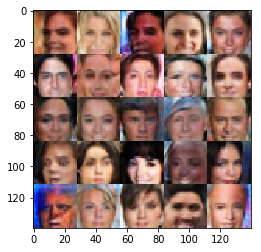

Epoch 2/5... Discriminator Loss: 1.5534... Generator Loss: 0.3334
Epoch 2/5... Discriminator Loss: 1.1895... Generator Loss: 0.5720


KeyboardInterrupt: 

In [15]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join('/', 'celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Done

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.